# EDA

In [1]:
import numpy as np
import pandas as pd
import warnings
import gc
from tqdm import tqdm_notebook
import lightgbm as lgb
from scipy.sparse import vstack, csr_matrix, save_npz, load_npz
from sklearn.preprocessing import LabelEncoder, OneHotEncoder
from sklearn.model_selection import StratifiedKFold
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import roc_auc_score
warnings.filterwarnings("ignore")
gc.enable()
sns.set()

In [2]:
pd.set_option('max_rows', 200)
pd.set_option('max_colwidth', 500)
pd.set_option('max_columns', 500)

## Data Load

In [401]:
train = pd.read_csv('./data/train.csv')
test = pd.read_csv('./data/test.csv')
train.shape, test.shape

((200000, 202), (200000, 201))

In [402]:
col_list = [col for col in train.columns if col not in ['ID_code', 'target']]

## Find Time Series

In [362]:
result = {}
for col in tqdm_notebook(col_list):
    windows = 100
    iterations = 200000 / windows
    target = train.sort_values(col).target.values
    result[col] = []
    for i in range(int(iterations)):
        result[col].append(target[i * windows: (i + 1) * windows].sum())

In [363]:
time_series = pd.DataFrame(result).T

## Let`s EDA !

## 오른쪽 위
* var0, var1, var2, var5, var6, var8, var11, var15, var16, var18, var22, var24, var26, var32, var35, var48, var49, var51, var52, var53
* var3, var4, var37, var40, var48, var55, var60, var61, var62, var65, var66, var67, var69, var70, var71, var78, var79, var82, var89, var90, var91, var94, var95, var97, var99, var104, var105, var106, var110, var111, var112, var118, var119, var125, var128, var130, var133, var134, 135, 137, var140, var144, var145, var147

## 왼쪽 위
* var9, var12, var13, var20, var21, var23, var28, var33, var34, var36, var43, var44, var50, var56
* var14, var31, var54, var57, var58, var59, var63, var68, var73, var75, var76, var77, var80, var81, var83, var85, var86, var87, var88, var92, var93, var102, var107, var109, var113, var114, var115, var116, , var121, var122, var123, var127, var131, var132, var138, var139, var141, var142, var143, var146, var148

## 주기성
* 136, 193
* var96, var98, var100, var117, var120, var124, var126, var129
* var7, var10, var17, var27, var29, var30, var38, var39, var41, var42
* var19, var25, var45, var46, var47, var64, var72, var74, var84, var101, var103

## 특이패턴
* var108

In [281]:
# idx = 0

In [333]:
col = col_list[idx]
plt.figure(figsize=(18, 8))
plt.plot(time_series.loc[col], label=col)
plt.legend()
idx += 1

IndexError: list index out of range

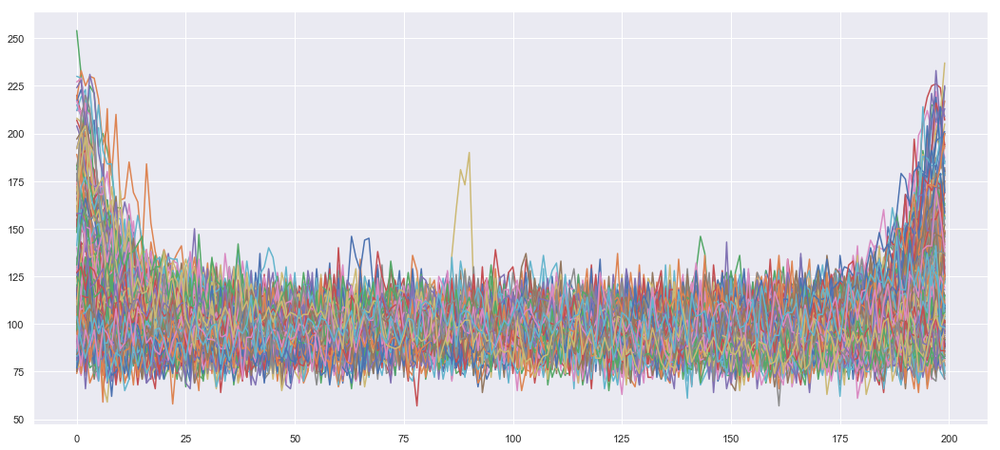

In [360]:
plt.figure(figsize=(18, 8))
for col in col_list:
    plt.plot(time_series.loc[col])

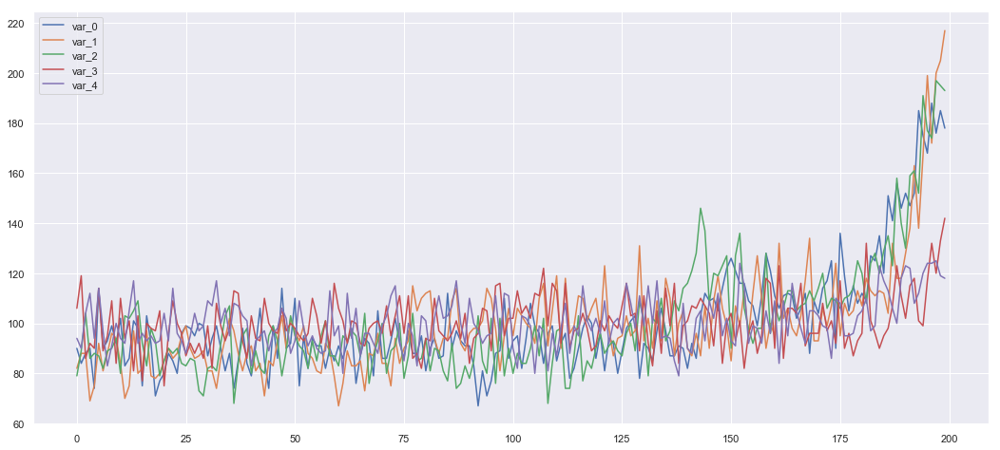

In [72]:
idx = 0
plt.figure(figsize=(18, 8))
for col in col_list[idx * 5:(idx + 1) * 5]:
    plt.plot(time_series.loc[col], label=col)
plt.legend()
idx += 1

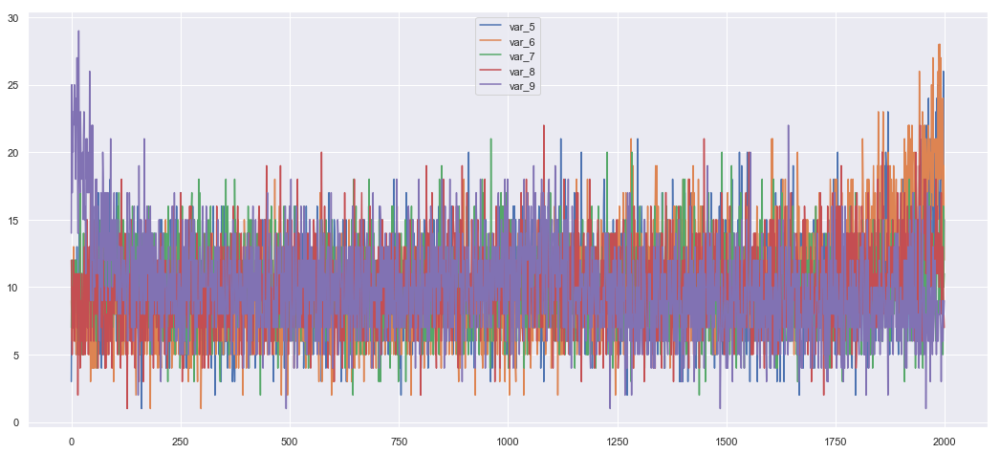

In [65]:
plt.figure(figsize=(18, 8))
for col in col_list[idx * 5:(idx + 1) * 5]:
    plt.plot(time_series.loc[col], label=col)
plt.legend()
idx += 1

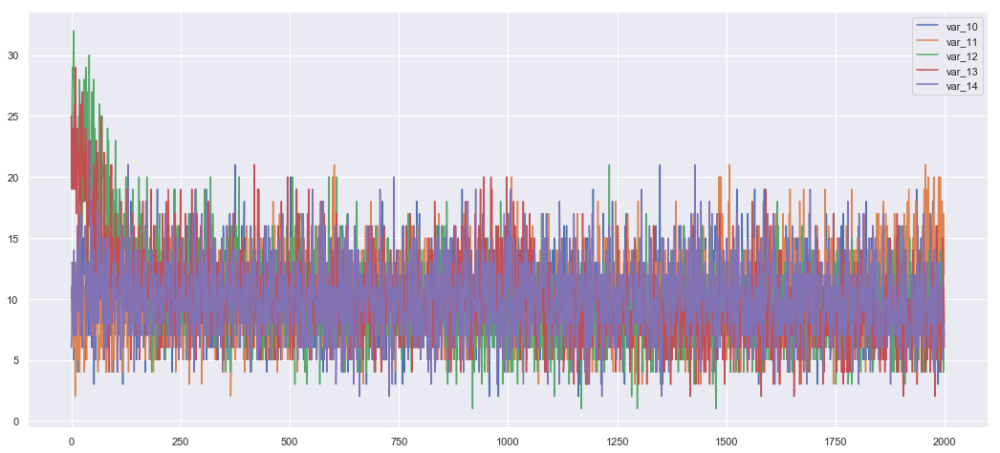

In [66]:
plt.figure(figsize=(18, 8))
for col in col_list[idx * 5:(idx + 1) * 5]:
    plt.plot(time_series.loc[col], label=col)
plt.legend()
idx += 1

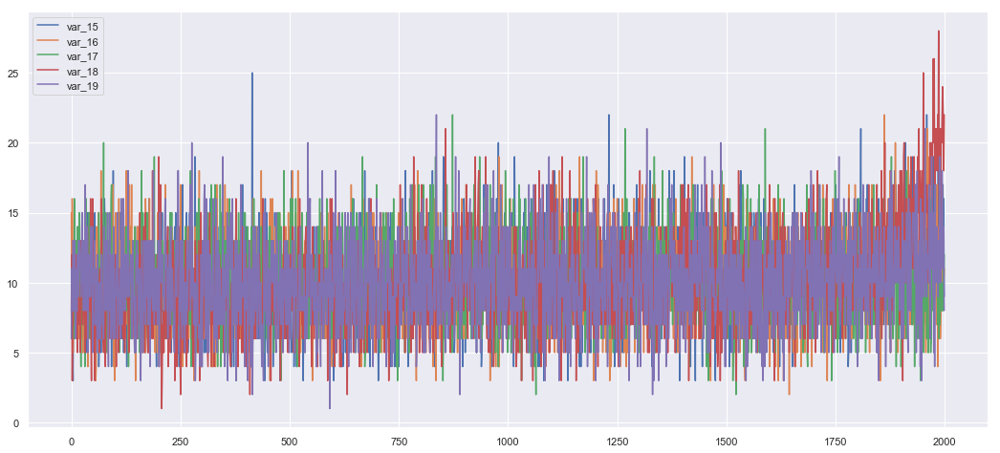

In [67]:
plt.figure(figsize=(18, 8))
for col in col_list[idx * 5:(idx + 1) * 5]:
    plt.plot(time_series.loc[col], label=col)
plt.legend()
idx += 1

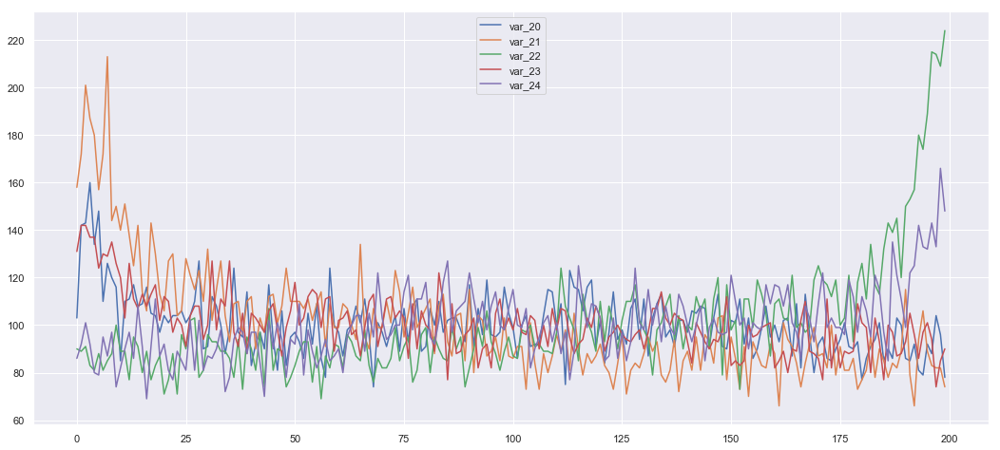

In [22]:
plt.figure(figsize=(18, 8))
for col in col_list[idx * 5:(idx + 1) * 5]:
    plt.plot(time_series.loc[col], label=col)
plt.legend()
idx += 1

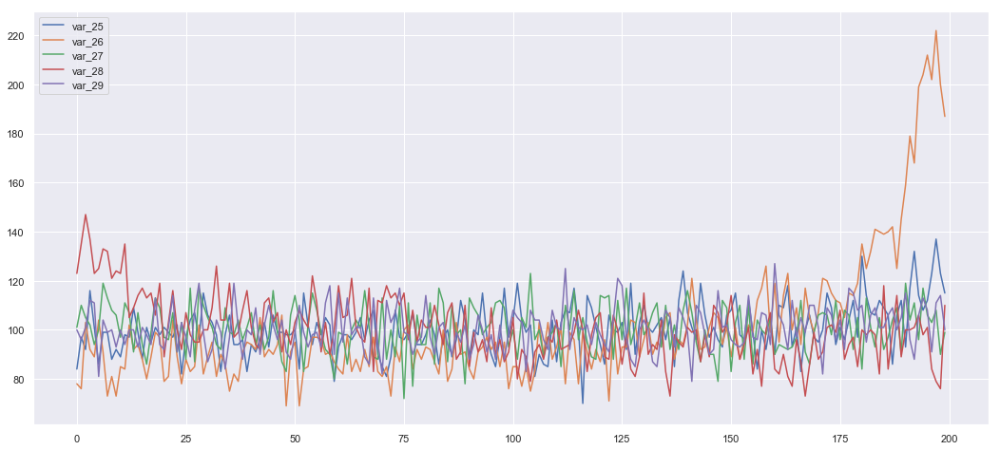

In [23]:
plt.figure(figsize=(18, 8))
for col in col_list[idx * 5:(idx + 1) * 5]:
    plt.plot(time_series.loc[col], label=col)
plt.legend()
idx += 1

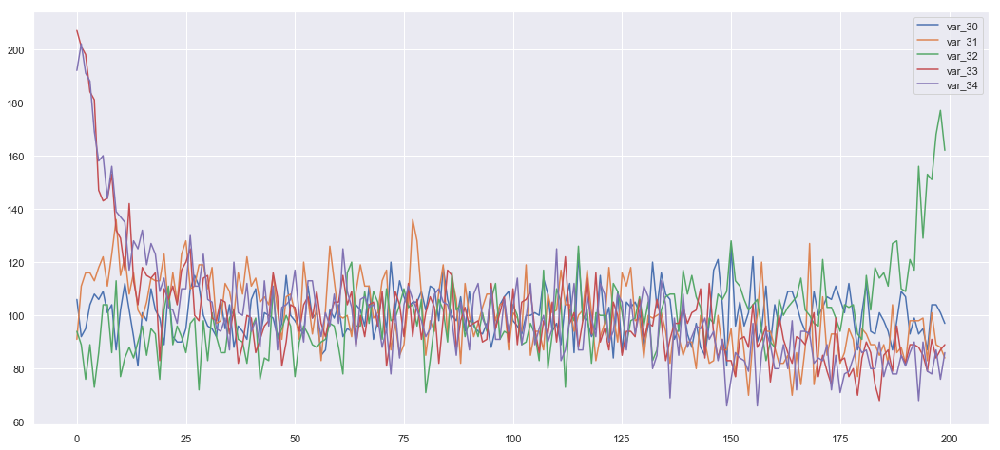

In [24]:
plt.figure(figsize=(18, 8))
for col in col_list[idx * 5:(idx + 1) * 5]:
    plt.plot(time_series.loc[col], label=col)
plt.legend()
idx += 1

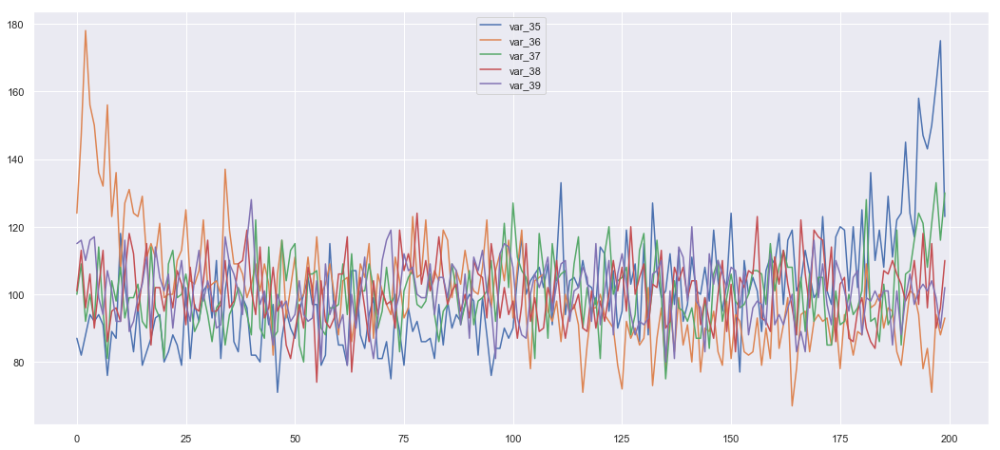

In [25]:
plt.figure(figsize=(18, 8))
for col in col_list[idx * 5:(idx + 1) * 5]:
    plt.plot(time_series.loc[col], label=col)
plt.legend()
idx += 1

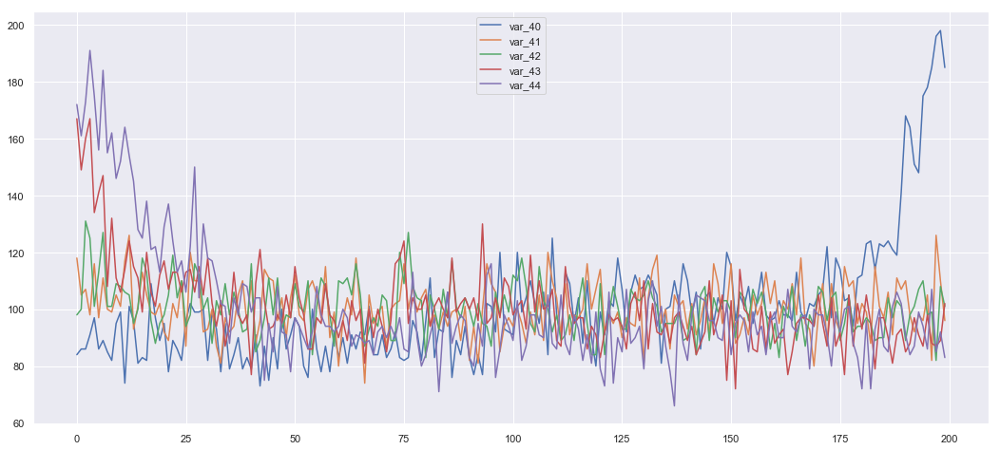

In [26]:
plt.figure(figsize=(18, 8))
for col in col_list[idx * 5:(idx + 1) * 5]:
    plt.plot(time_series.loc[col], label=col)
plt.legend()
idx += 1

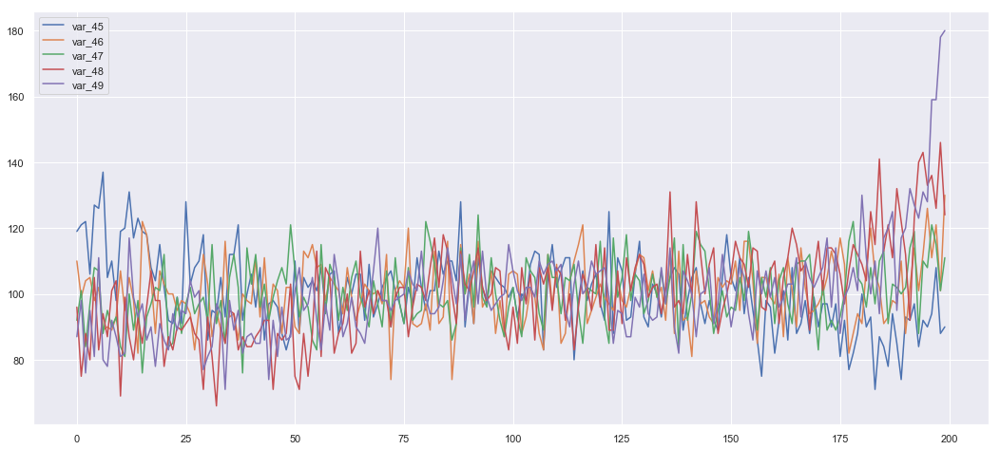

In [27]:
plt.figure(figsize=(18, 8))
for col in col_list[idx * 5:(idx + 1) * 5]:
    plt.plot(time_series.loc[col], label=col)
plt.legend()
idx += 1

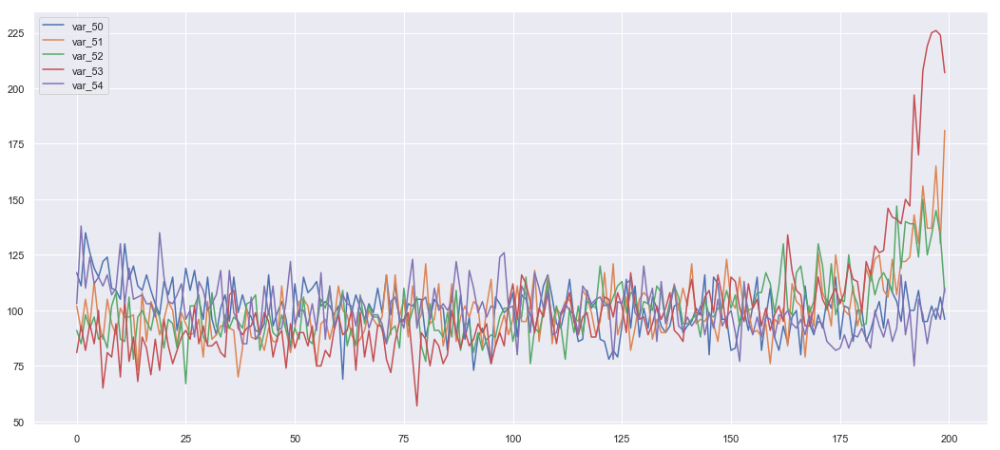

In [28]:
plt.figure(figsize=(18, 8))
for col in col_list[idx * 5:(idx + 1) * 5]:
    plt.plot(time_series.loc[col], label=col)
plt.legend()
idx += 1

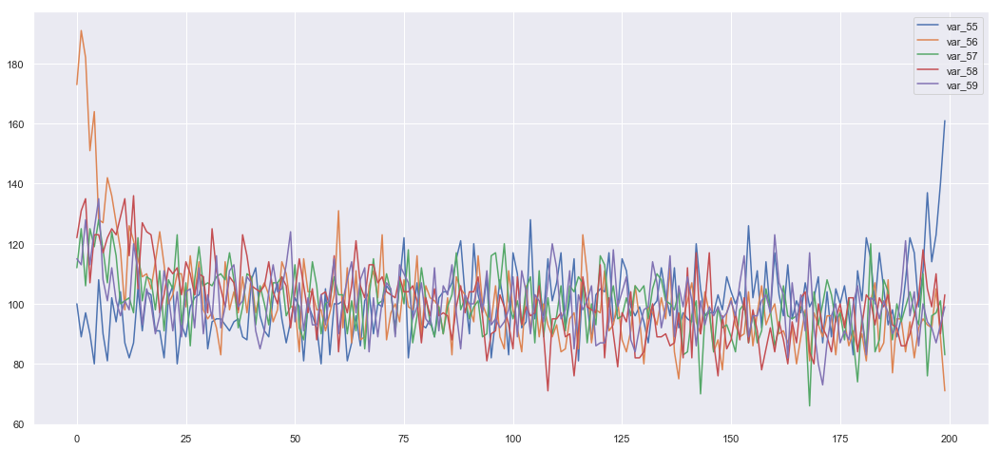

In [29]:
plt.figure(figsize=(18, 8))
for col in col_list[idx * 5:(idx + 1) * 5]:
    plt.plot(time_series.loc[col], label=col)
plt.legend()
idx += 1

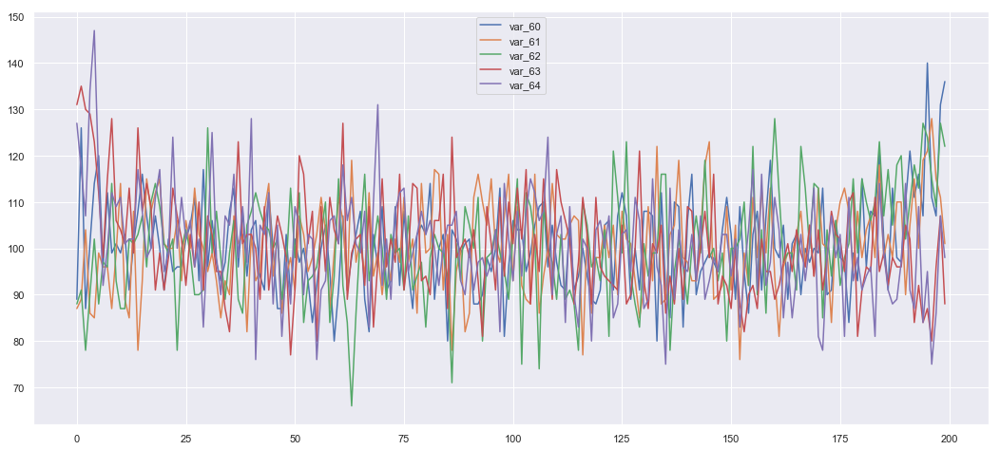

In [30]:
plt.figure(figsize=(18, 8))
for col in col_list[idx * 5:(idx + 1) * 5]:
    plt.plot(time_series.loc[col], label=col)
plt.legend()
idx += 1

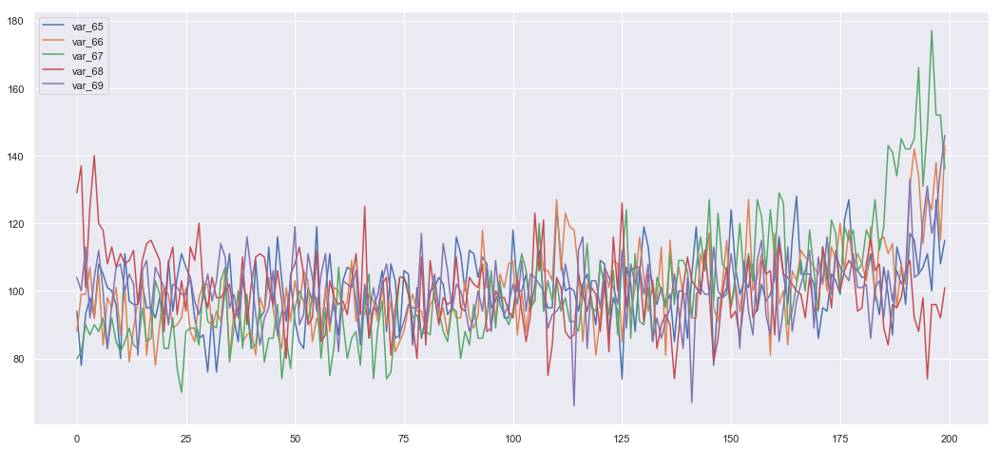

In [31]:
plt.figure(figsize=(18, 8))
for col in col_list[idx * 5:(idx + 1) * 5]:
    plt.plot(time_series.loc[col], label=col)
plt.legend()
idx += 1

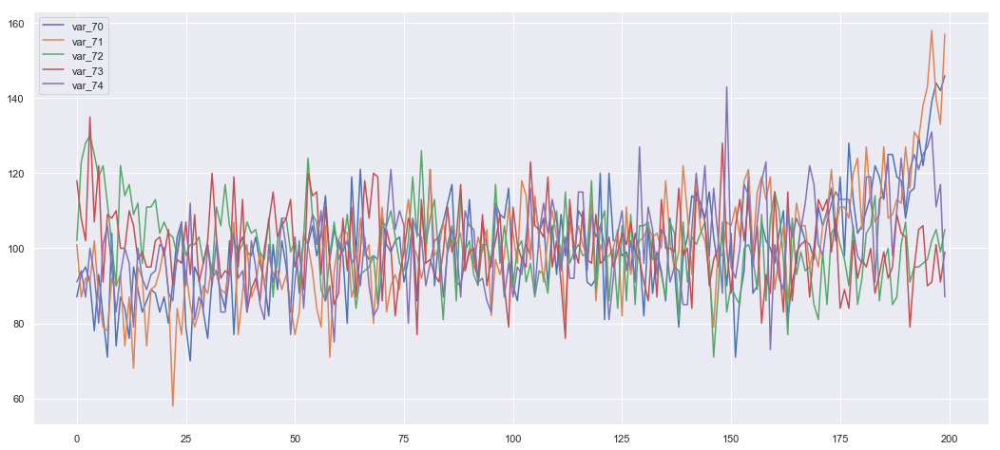

In [32]:
plt.figure(figsize=(18, 8))
for col in col_list[idx * 5:(idx + 1) * 5]:
    plt.plot(time_series.loc[col], label=col)
plt.legend()
idx += 1

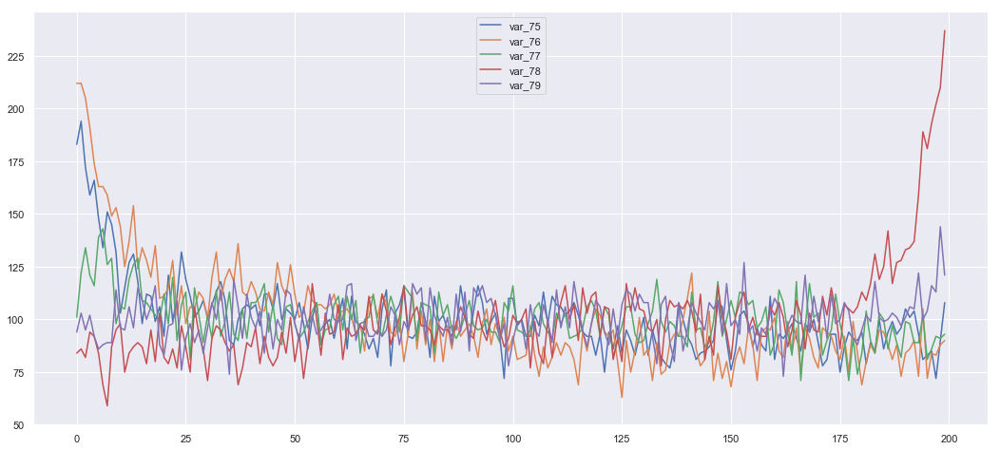

In [33]:
plt.figure(figsize=(18, 8))
for col in col_list[idx * 5:(idx + 1) * 5]:
    plt.plot(time_series.loc[col], label=col)
plt.legend()
idx += 1

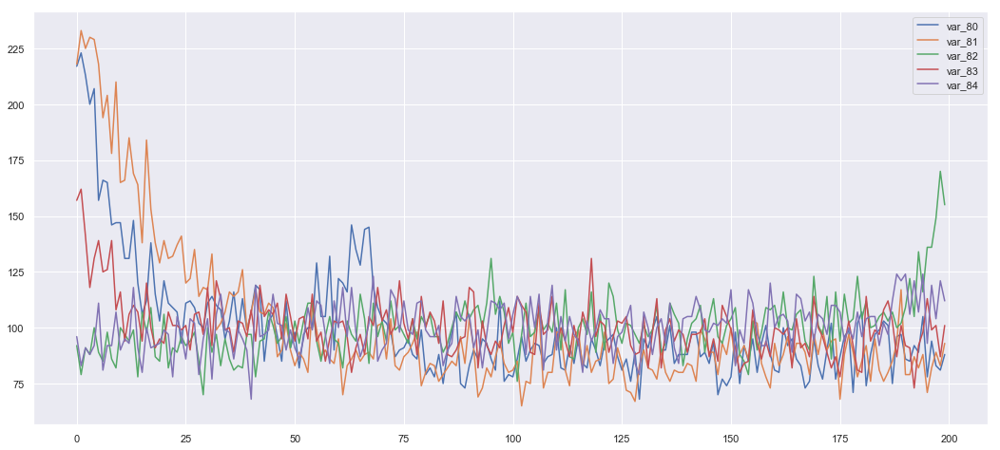

In [34]:
plt.figure(figsize=(18, 8))
for col in col_list[idx * 5:(idx + 1) * 5]:
    plt.plot(time_series.loc[col], label=col)
plt.legend()
idx += 1

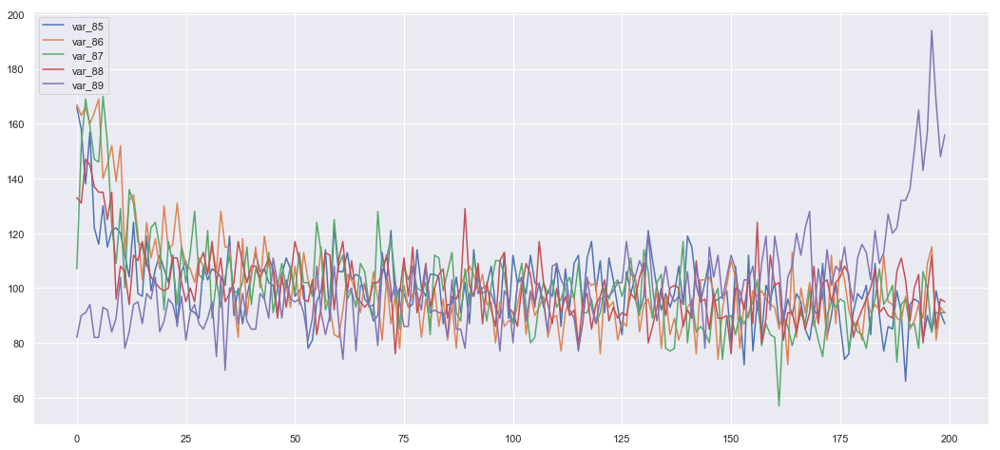

In [35]:
plt.figure(figsize=(18, 8))
for col in col_list[idx * 5:(idx + 1) * 5]:
    plt.plot(time_series.loc[col], label=col)
plt.legend()
idx += 1

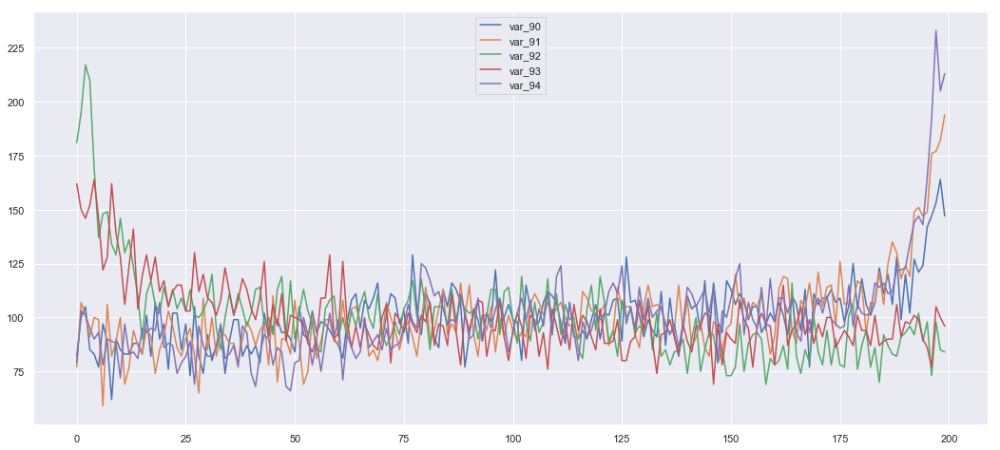

In [36]:
plt.figure(figsize=(18, 8))
for col in col_list[idx * 5:(idx + 1) * 5]:
    plt.plot(time_series.loc[col], label=col)
plt.legend()
idx += 1

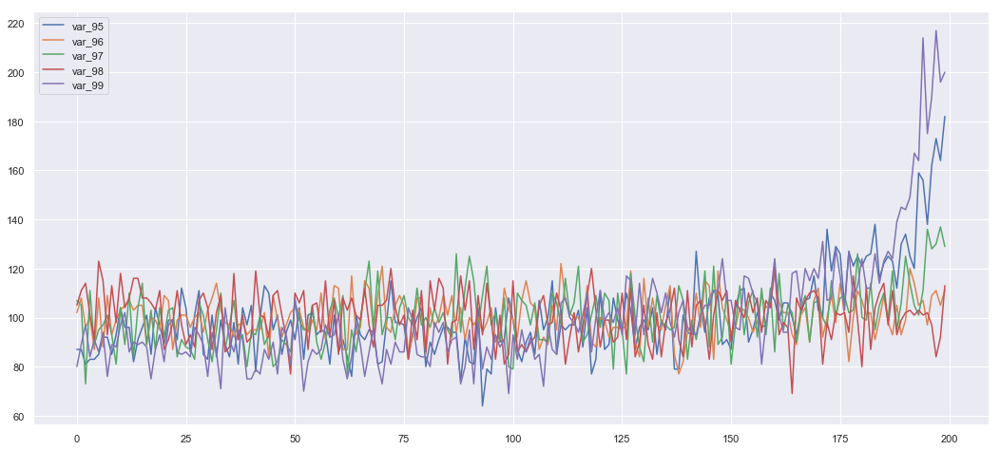

In [37]:
plt.figure(figsize=(18, 8))
for col in col_list[idx * 5:(idx + 1) * 5]:
    plt.plot(time_series.loc[col], label=col)
plt.legend()
idx += 1

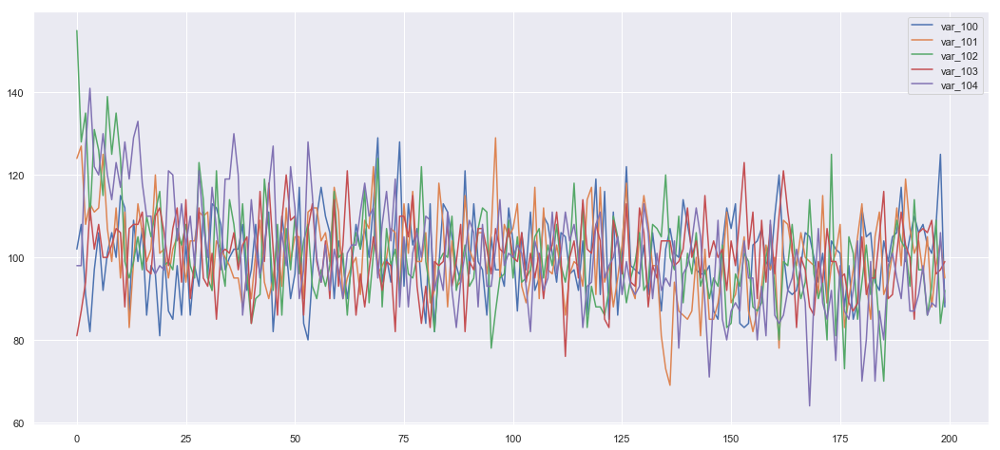

In [38]:
plt.figure(figsize=(18, 8))
for col in col_list[idx * 5:(idx + 1) * 5]:
    plt.plot(time_series.loc[col], label=col)
plt.legend()
idx += 1

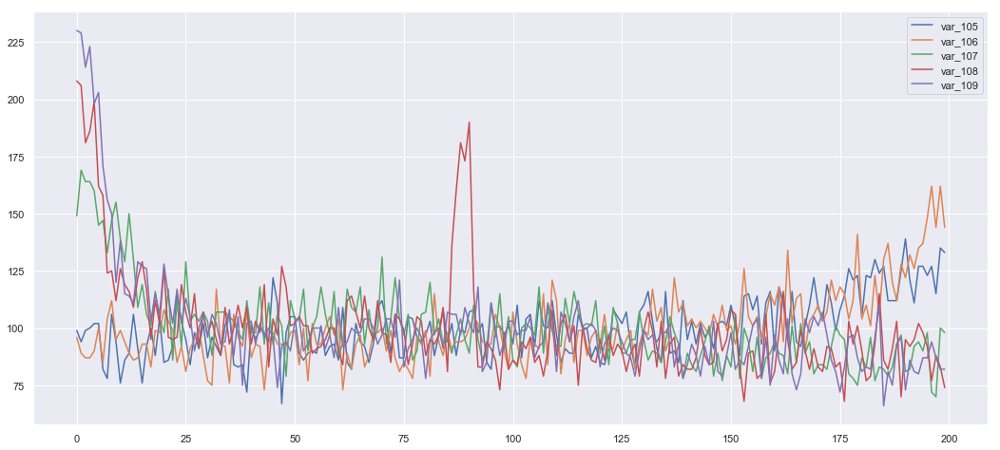

In [39]:
plt.figure(figsize=(18, 8))
for col in col_list[idx * 5:(idx + 1) * 5]:
    plt.plot(time_series.loc[col], label=col)
plt.legend()
idx += 1

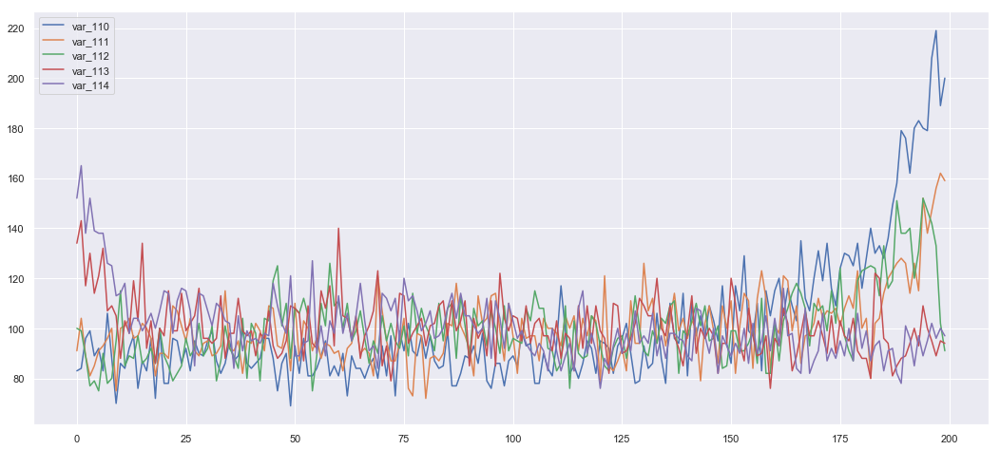

In [40]:
plt.figure(figsize=(18, 8))
for col in col_list[idx * 5:(idx + 1) * 5]:
    plt.plot(time_series.loc[col], label=col)
plt.legend()
idx += 1

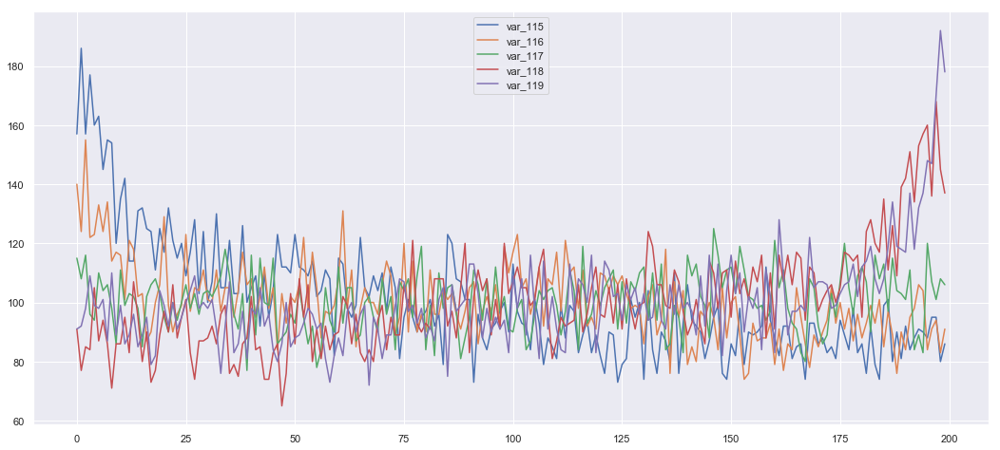

In [41]:
plt.figure(figsize=(18, 8))
for col in col_list[idx * 5:(idx + 1) * 5]:
    plt.plot(time_series.loc[col], label=col)
plt.legend()
idx += 1

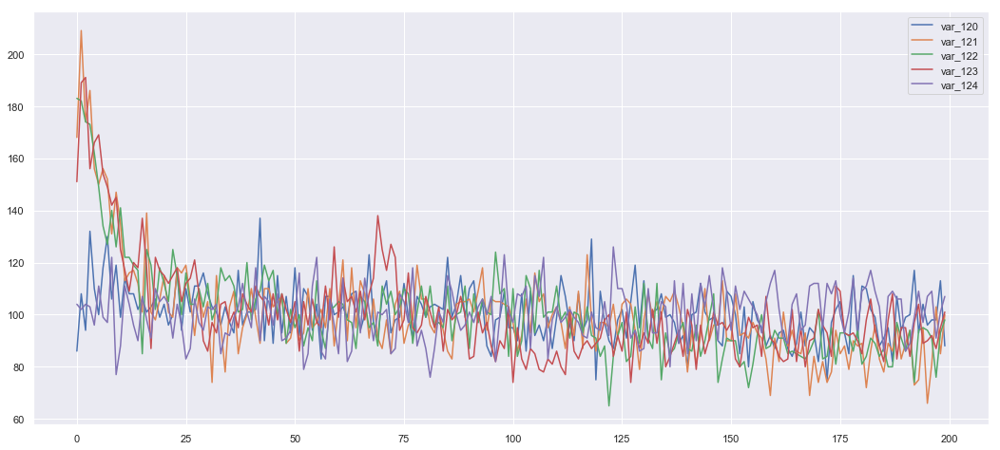

In [42]:
plt.figure(figsize=(18, 8))
for col in col_list[idx * 5:(idx + 1) * 5]:
    plt.plot(time_series.loc[col], label=col)
plt.legend()
idx += 1

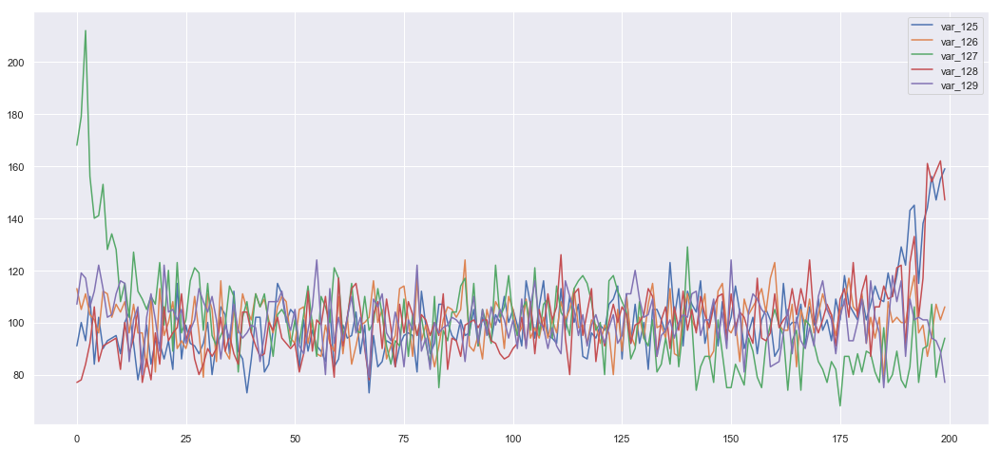

In [43]:
plt.figure(figsize=(18, 8))
for col in col_list[idx * 5:(idx + 1) * 5]:
    plt.plot(time_series.loc[col], label=col)
plt.legend()
idx += 1

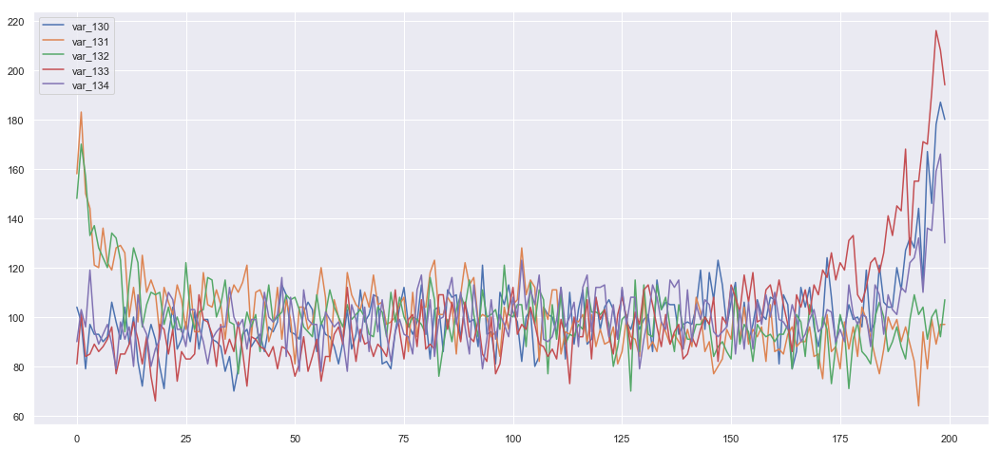

In [44]:
plt.figure(figsize=(18, 8))
for col in col_list[idx * 5:(idx + 1) * 5]:
    plt.plot(time_series.loc[col], label=col)
plt.legend()
idx += 1

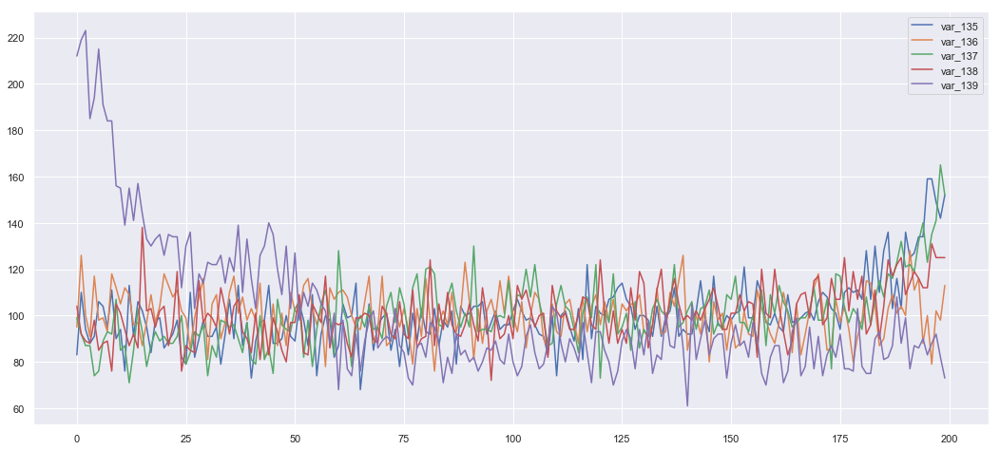

In [45]:
plt.figure(figsize=(18, 8))
for col in col_list[idx * 5:(idx + 1) * 5]:
    plt.plot(time_series.loc[col], label=col)
plt.legend()
idx += 1

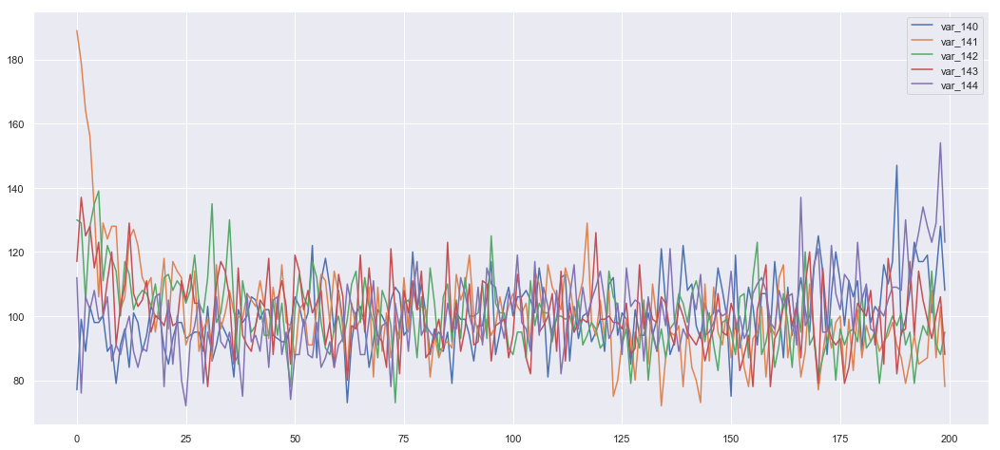

In [46]:
plt.figure(figsize=(18, 8))
for col in col_list[idx * 5:(idx + 1) * 5]:
    plt.plot(time_series.loc[col], label=col)
plt.legend()
idx += 1

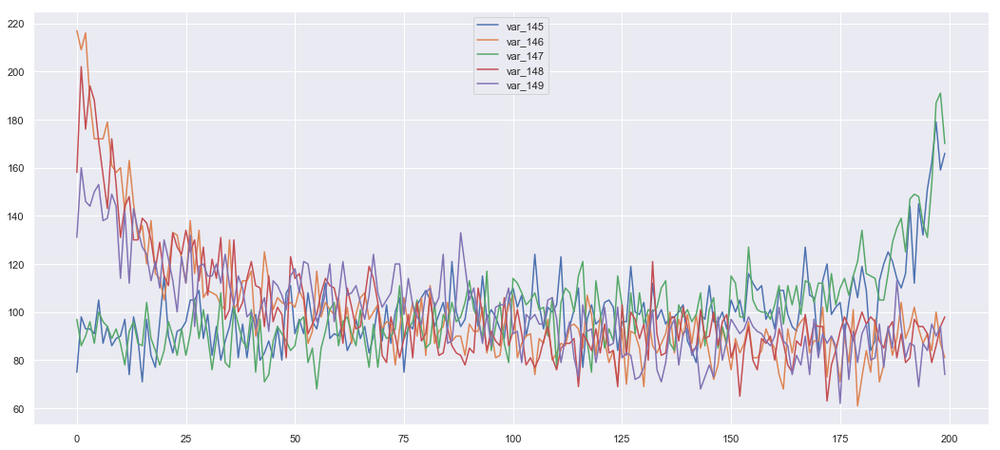

In [47]:
plt.figure(figsize=(18, 8))
for col in col_list[idx * 5:(idx + 1) * 5]:
    plt.plot(time_series.loc[col], label=col)
plt.legend()
idx += 1

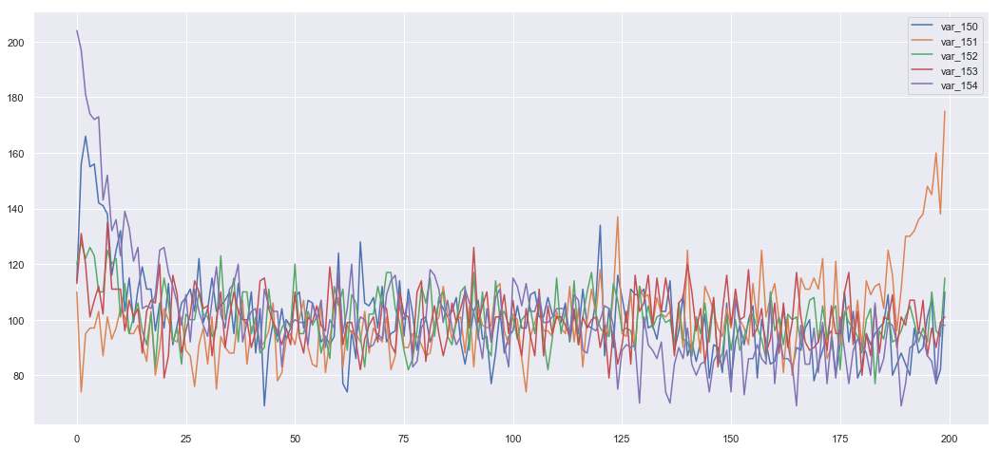

In [48]:
plt.figure(figsize=(18, 8))
for col in col_list[idx * 5:(idx + 1) * 5]:
    plt.plot(time_series.loc[col], label=col)
plt.legend()
idx += 1

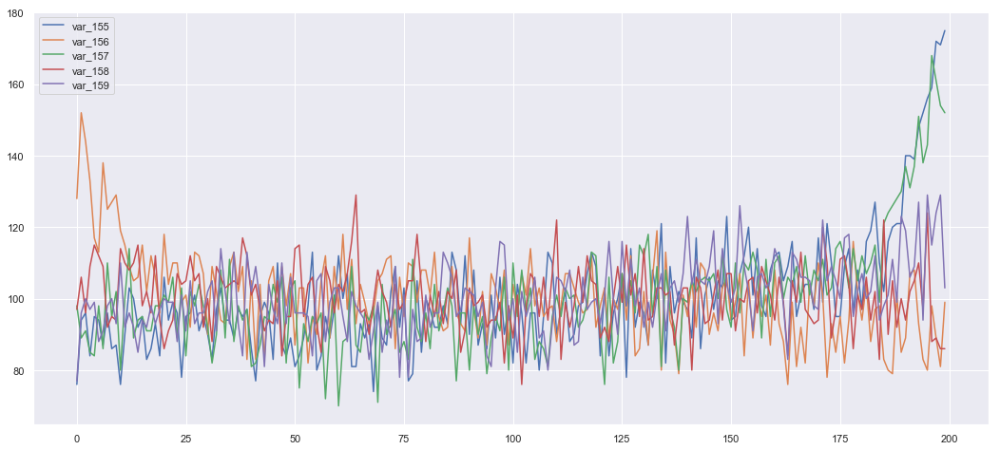

In [49]:
plt.figure(figsize=(18, 8))
for col in col_list[idx * 5:(idx + 1) * 5]:
    plt.plot(time_series.loc[col], label=col)
plt.legend()
idx += 1

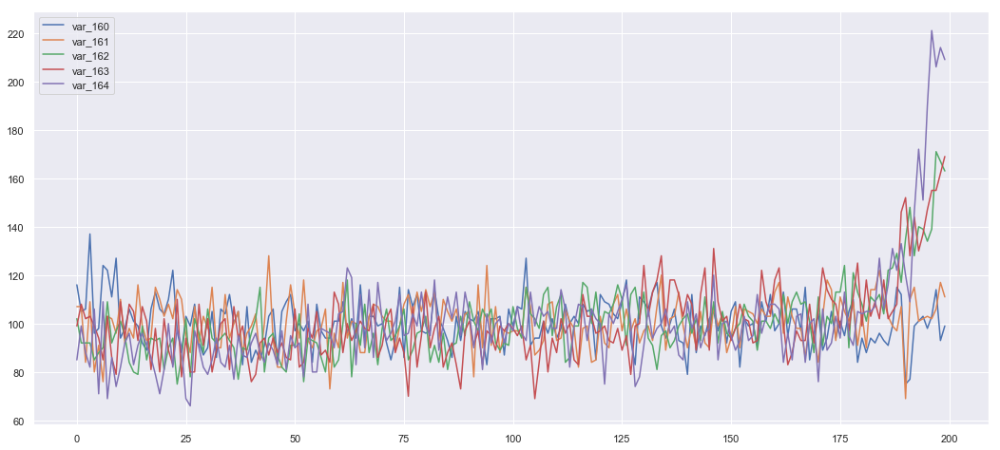

In [50]:
plt.figure(figsize=(18, 8))
for col in col_list[idx * 5:(idx + 1) * 5]:
    plt.plot(time_series.loc[col], label=col)
plt.legend()
idx += 1

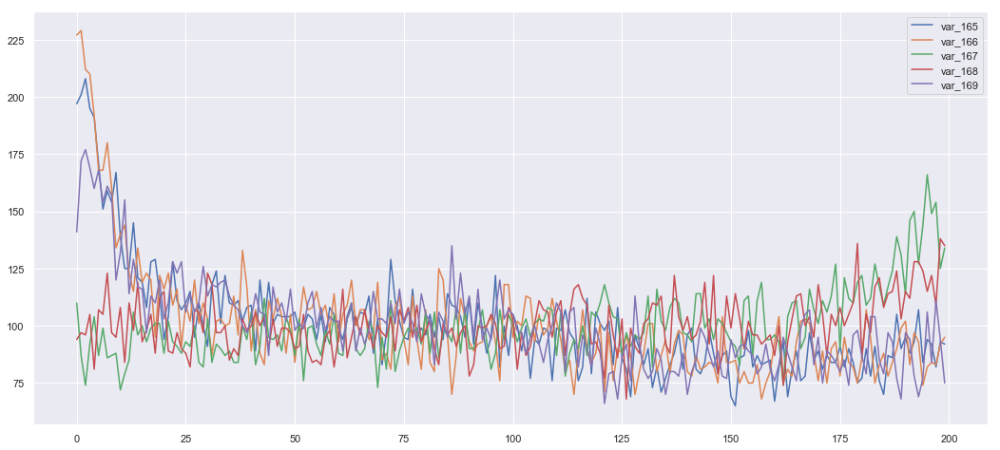

In [51]:
plt.figure(figsize=(18, 8))
for col in col_list[idx * 5:(idx + 1) * 5]:
    plt.plot(time_series.loc[col], label=col)
plt.legend()
idx += 1

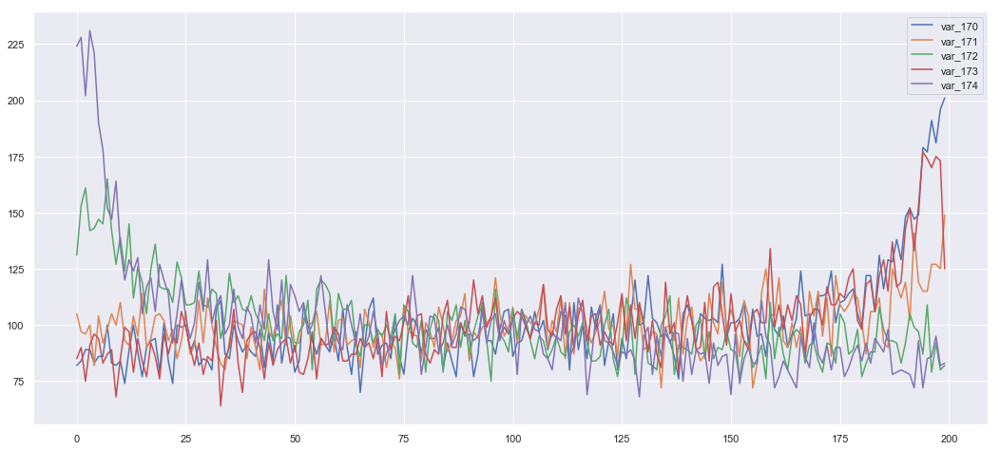

In [52]:
plt.figure(figsize=(18, 8))
for col in col_list[idx * 5:(idx + 1) * 5]:
    plt.plot(time_series.loc[col], label=col)
plt.legend()
idx += 1

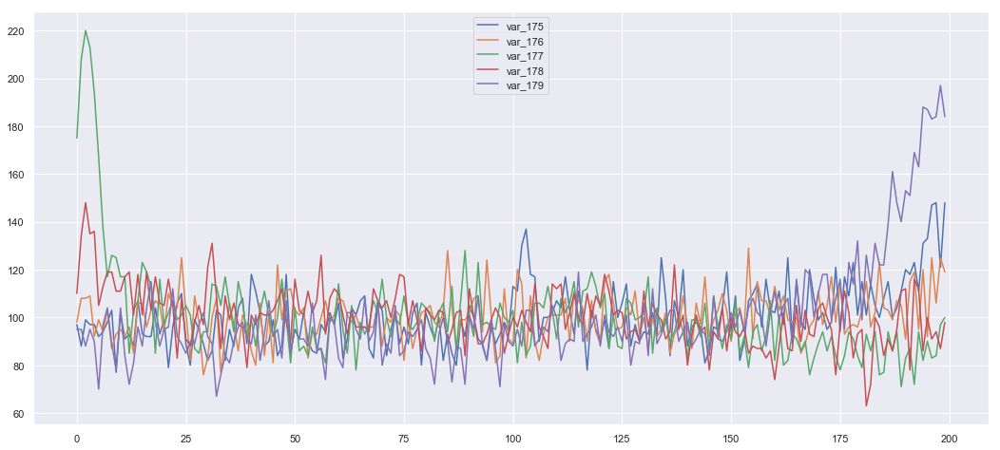

In [53]:
plt.figure(figsize=(18, 8))
for col in col_list[idx * 5:(idx + 1) * 5]:
    plt.plot(time_series.loc[col], label=col)
plt.legend()
idx += 1

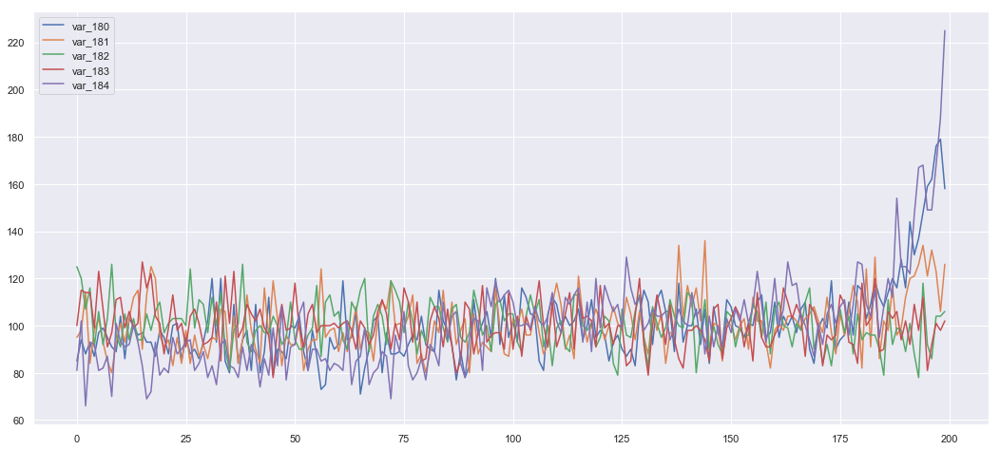

In [54]:
plt.figure(figsize=(18, 8))
for col in col_list[idx * 5:(idx + 1) * 5]:
    plt.plot(time_series.loc[col], label=col)
plt.legend()
idx += 1

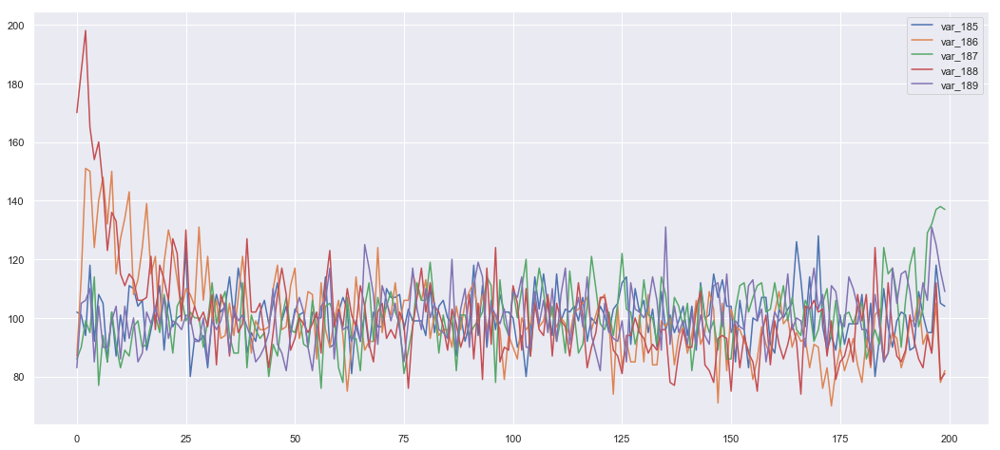

In [55]:
plt.figure(figsize=(18, 8))
for col in col_list[idx * 5:(idx + 1) * 5]:
    plt.plot(time_series.loc[col], label=col)
plt.legend()
idx += 1

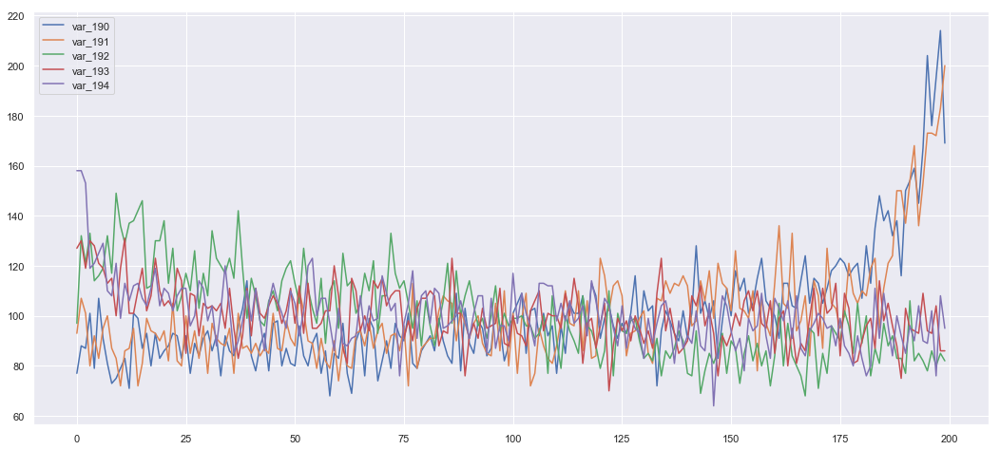

In [56]:
plt.figure(figsize=(18, 8))
for col in col_list[idx * 5:(idx + 1) * 5]:
    plt.plot(time_series.loc[col], label=col)
plt.legend()
idx += 1

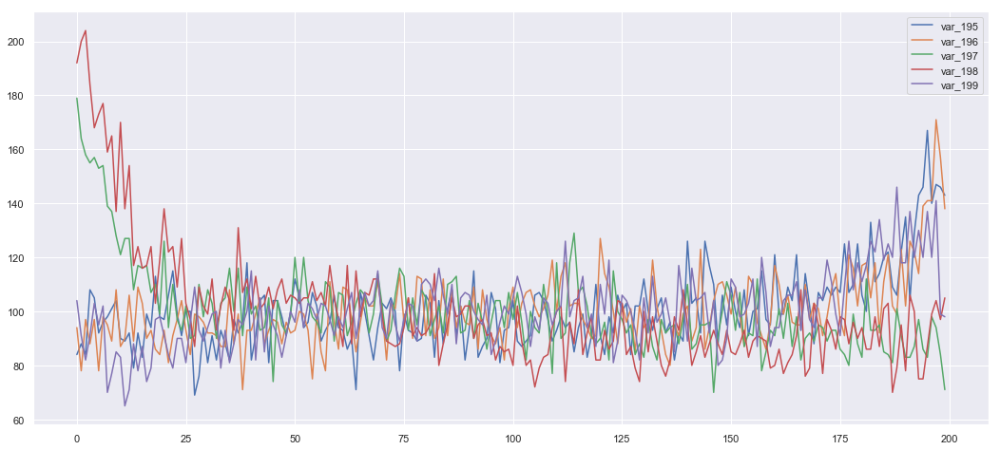

In [57]:
plt.figure(figsize=(18, 8))
for col in col_list[idx * 5:(idx + 1) * 5]:
    plt.plot(time_series.loc[col], label=col)
plt.legend()
idx += 1

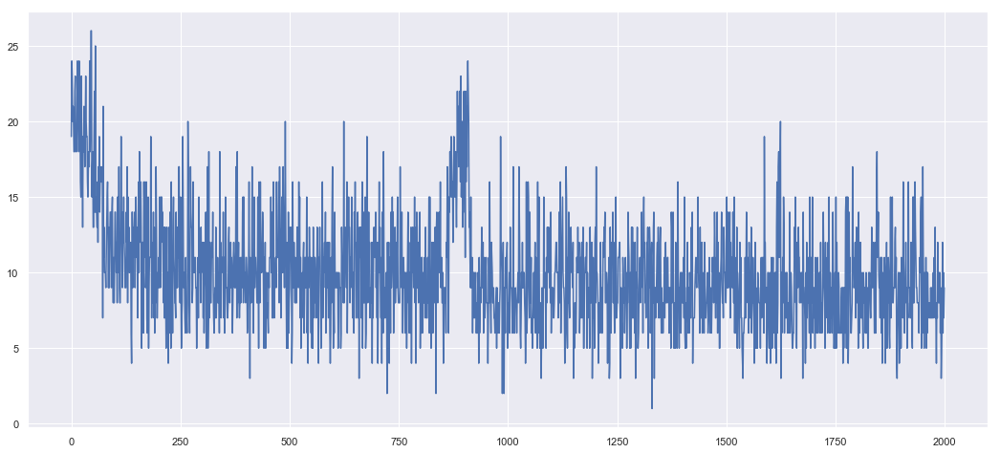

In [69]:
plt.figure(figsize=(18, 8))
plt.plot(time_series.loc['var_108'], label=col)

### train

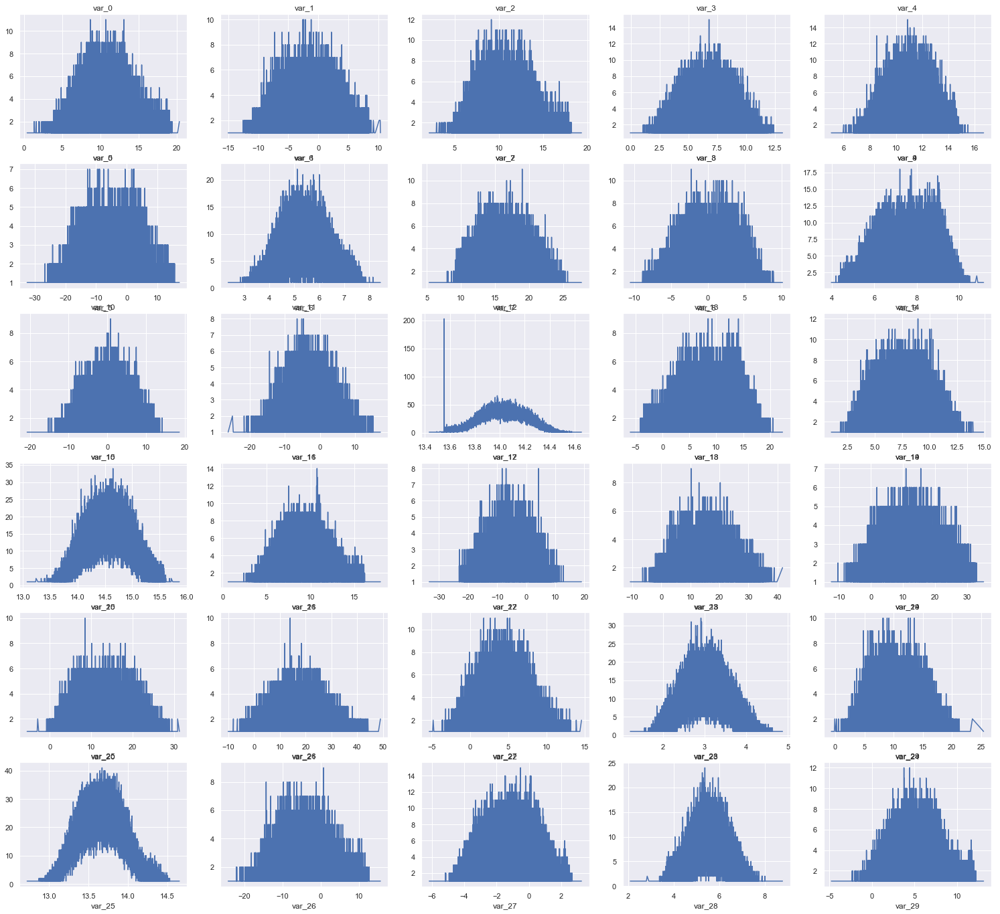

In [491]:
idx = 0
plt.figure(figsize=(26, 24))
for i, col in enumerate(list(train.columns)[30*idx+2:30*(idx+1)+2]):
    plt.subplot(6, 5, i + 1)
    train.groupby(col).size().plot()
    plt.title(col)

idx += 1

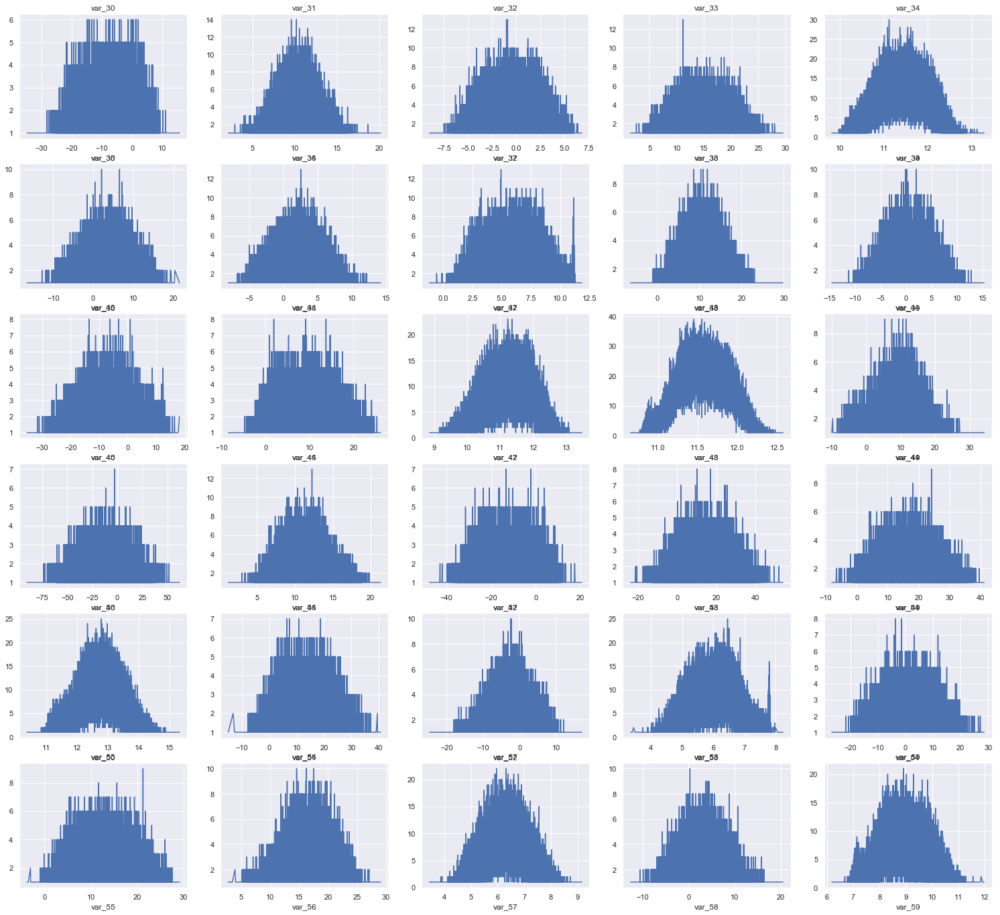

In [492]:
plt.figure(figsize=(26, 24))
for i, col in enumerate(list(train.columns)[30*idx+2:30*(idx+1)+2]):
    plt.subplot(6, 5, i + 1)
    train.groupby(col).size().plot()
    plt.title(col)

idx += 1

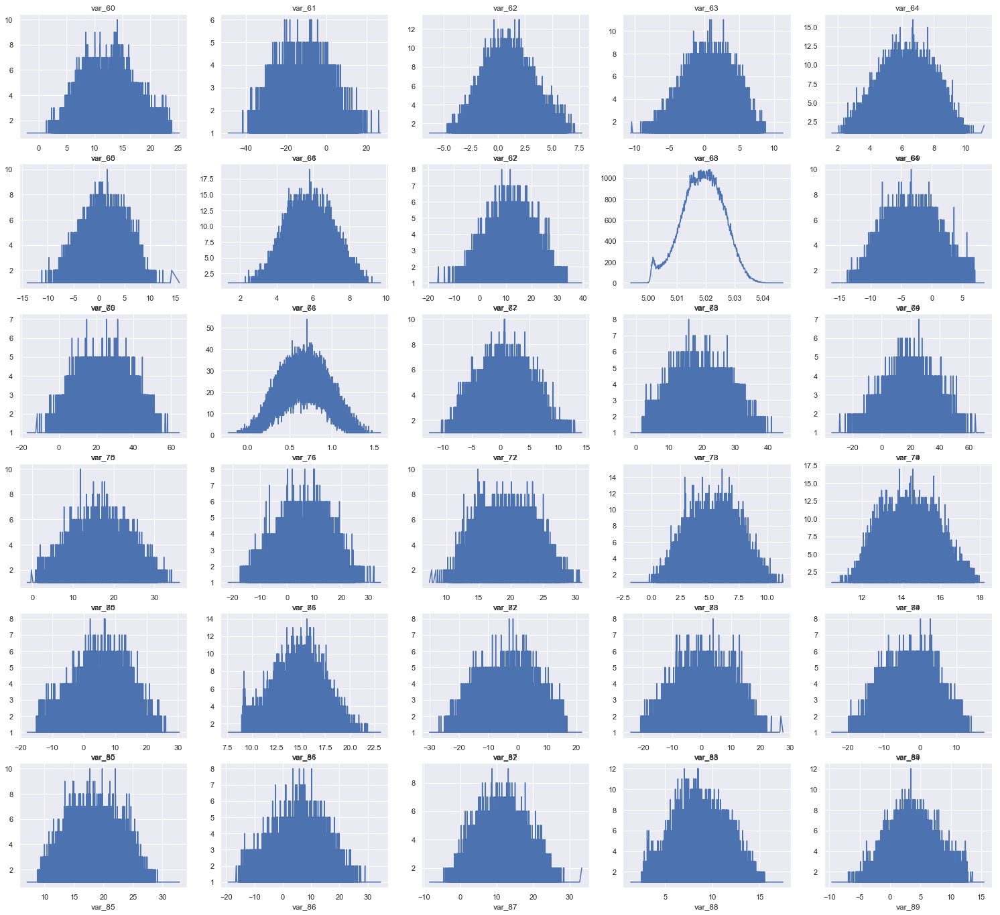

In [493]:
plt.figure(figsize=(26, 24))
for i, col in enumerate(list(train.columns)[30*idx+2:30*(idx+1)+2]):
    plt.subplot(6, 5, i + 1)
    train.groupby(col).size().plot()
    plt.title(col)

idx += 1

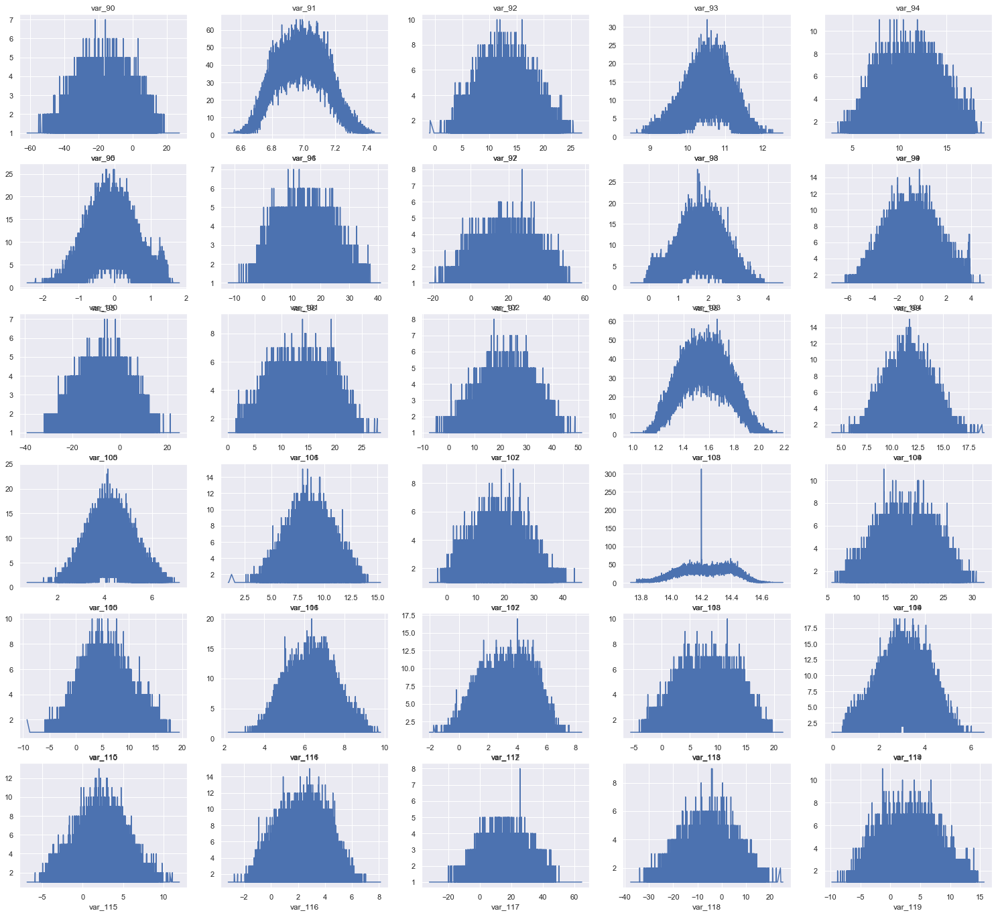

In [494]:
plt.figure(figsize=(26, 24))
for i, col in enumerate(list(train.columns)[30*idx+2:30*(idx+1)+2]):
    plt.subplot(6, 5, i + 1)
    train.groupby(col).size().plot()
    plt.title(col)

idx += 1

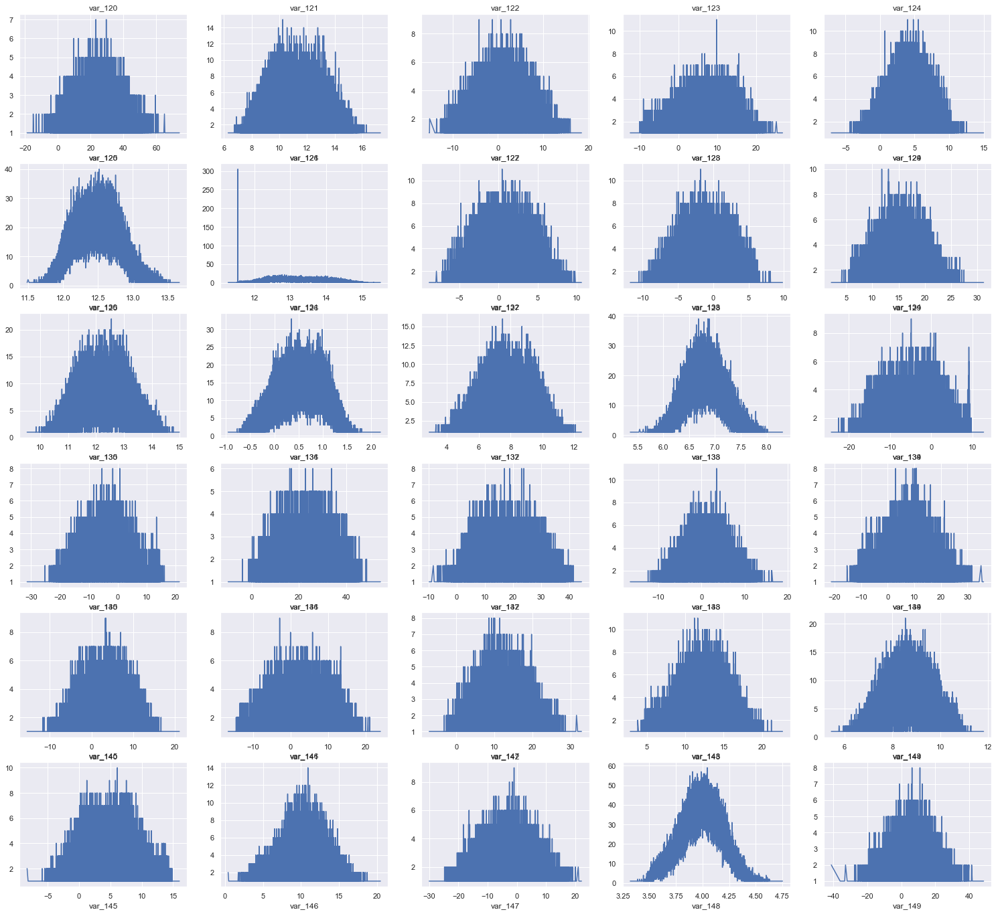

In [495]:
plt.figure(figsize=(26, 24))
for i, col in enumerate(list(train.columns)[30*idx+2:30*(idx+1)+2]):
    plt.subplot(6, 5, i + 1)
    train.groupby(col).size().plot()
    plt.title(col)

idx += 1

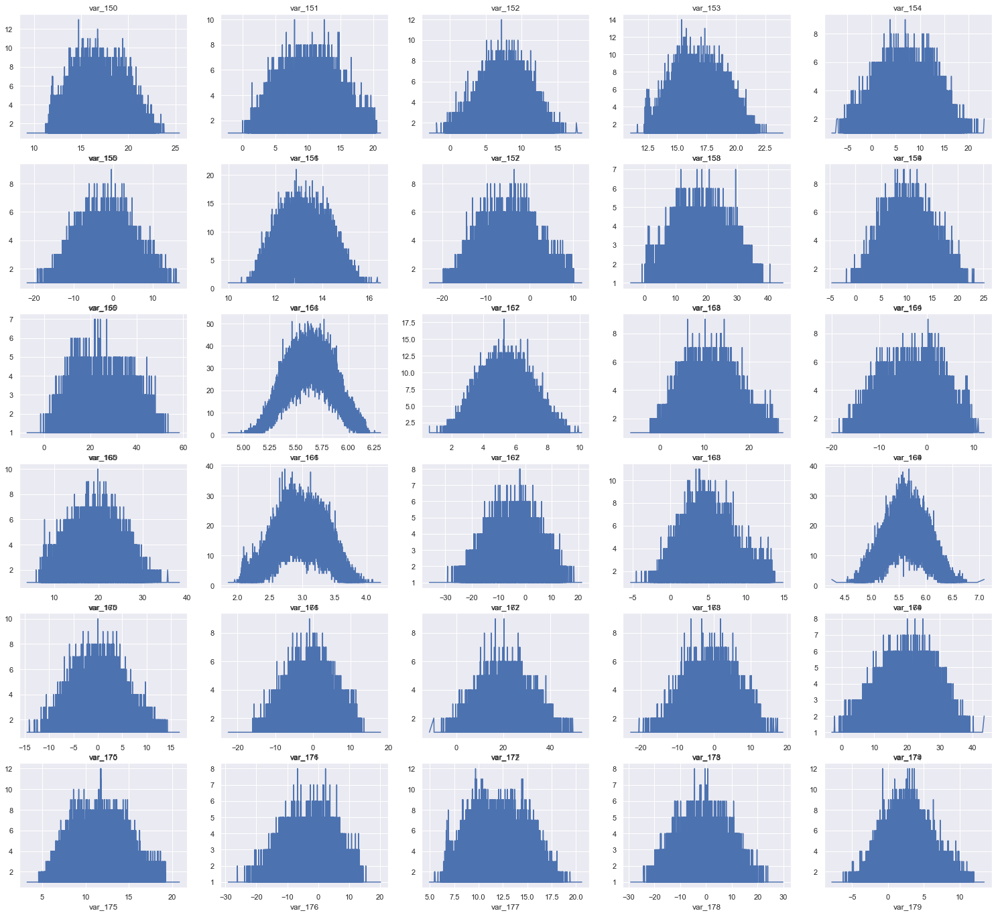

In [496]:
plt.figure(figsize=(26, 24))
for i, col in enumerate(list(train.columns)[30*idx+2:30*(idx+1)+2]):
    plt.subplot(6, 5, i + 1)
    train.groupby(col).size().plot()
    plt.title(col)

idx += 1

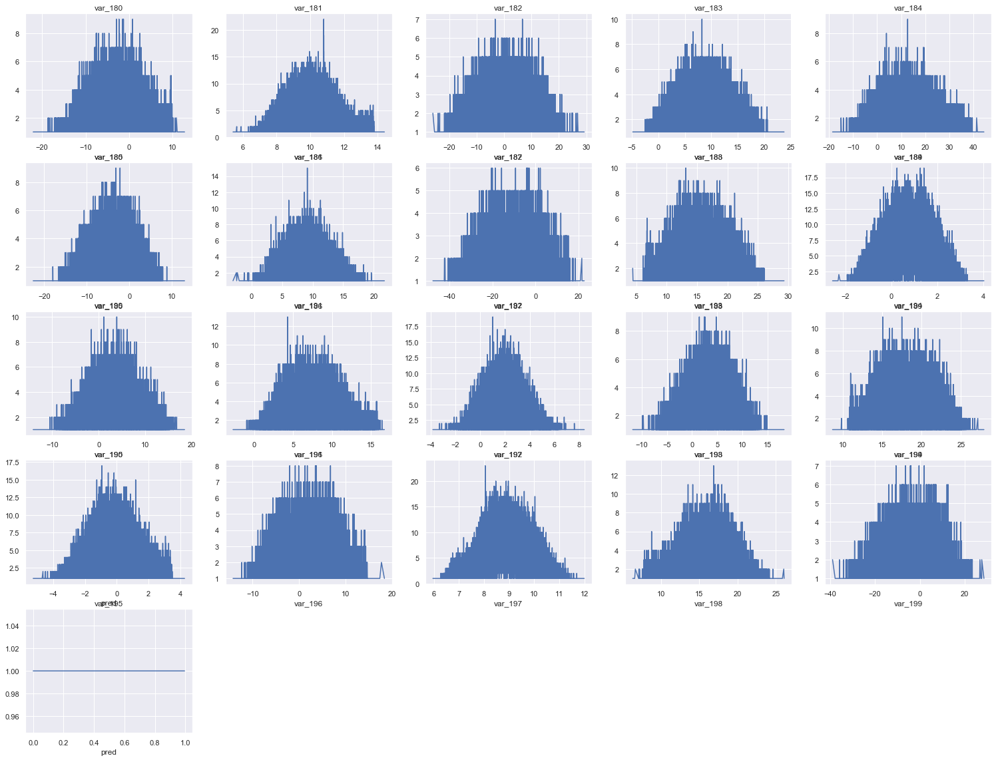

In [497]:
plt.figure(figsize=(26, 24))
for i, col in enumerate(list(train.columns)[30*idx+2:30*(idx+1)+2]):
    plt.subplot(6, 5, i + 1)
    train.groupby(col).size().plot()
    plt.title(col)

idx += 1

### test

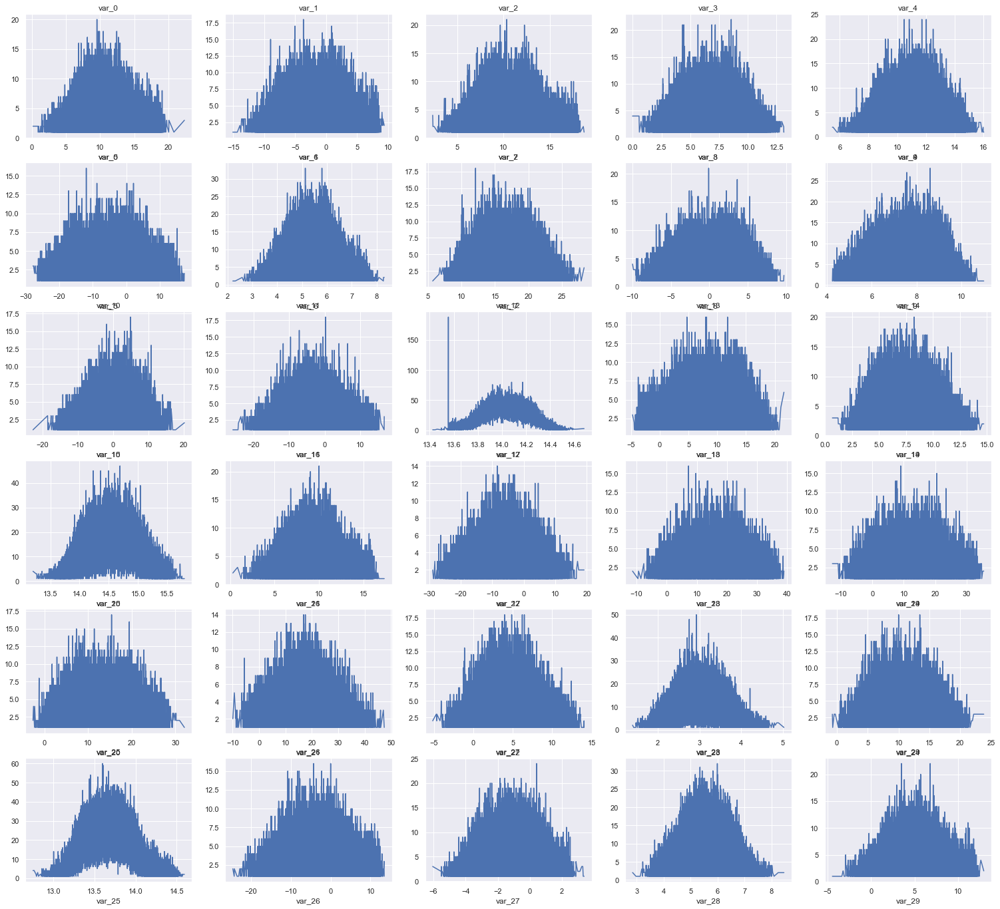

In [498]:
idx = 0
plt.figure(figsize=(26, 24))
for i, col in enumerate(list(train.columns)[30*idx+2:30*(idx+1)+2]):
    plt.subplot(6, 5, i + 1)
    test.groupby(col).size().plot()
    plt.title(col)

idx += 1

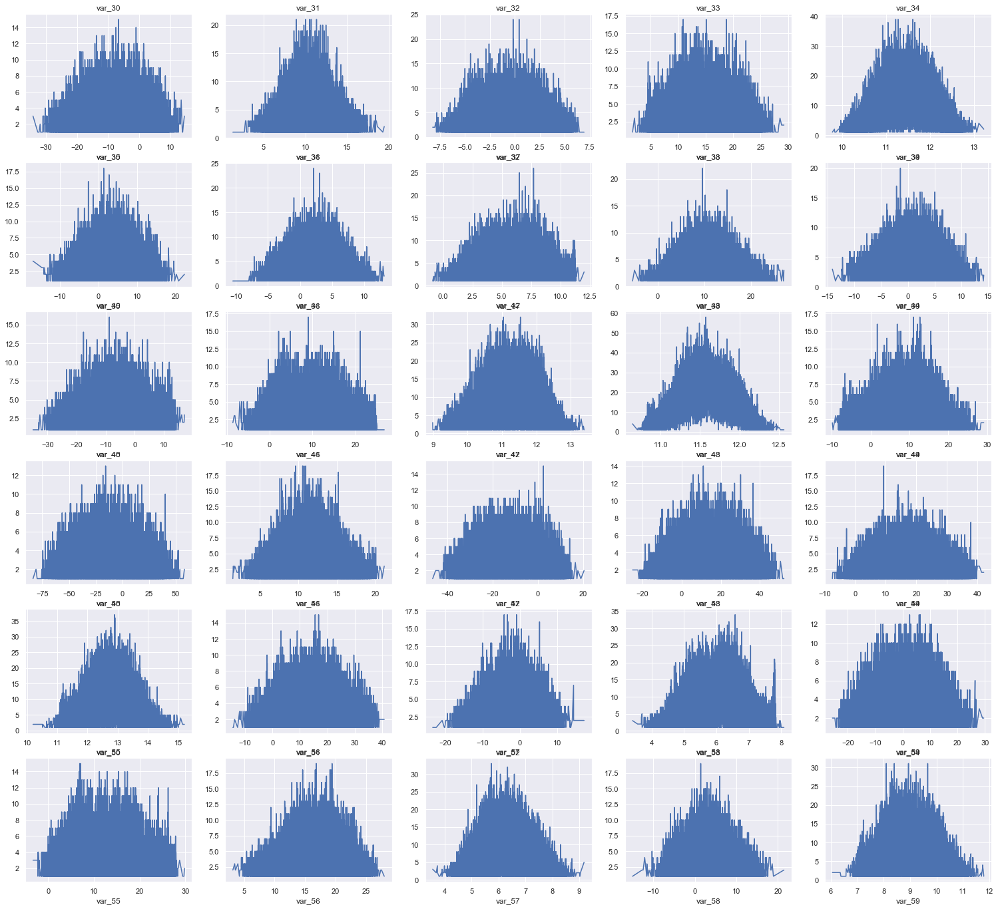

In [499]:
plt.figure(figsize=(26, 24))
for i, col in enumerate(list(train.columns)[30*idx+2:30*(idx+1)+2]):
    plt.subplot(6, 5, i + 1)
    test.groupby(col).size().plot()
    plt.title(col)

idx += 1

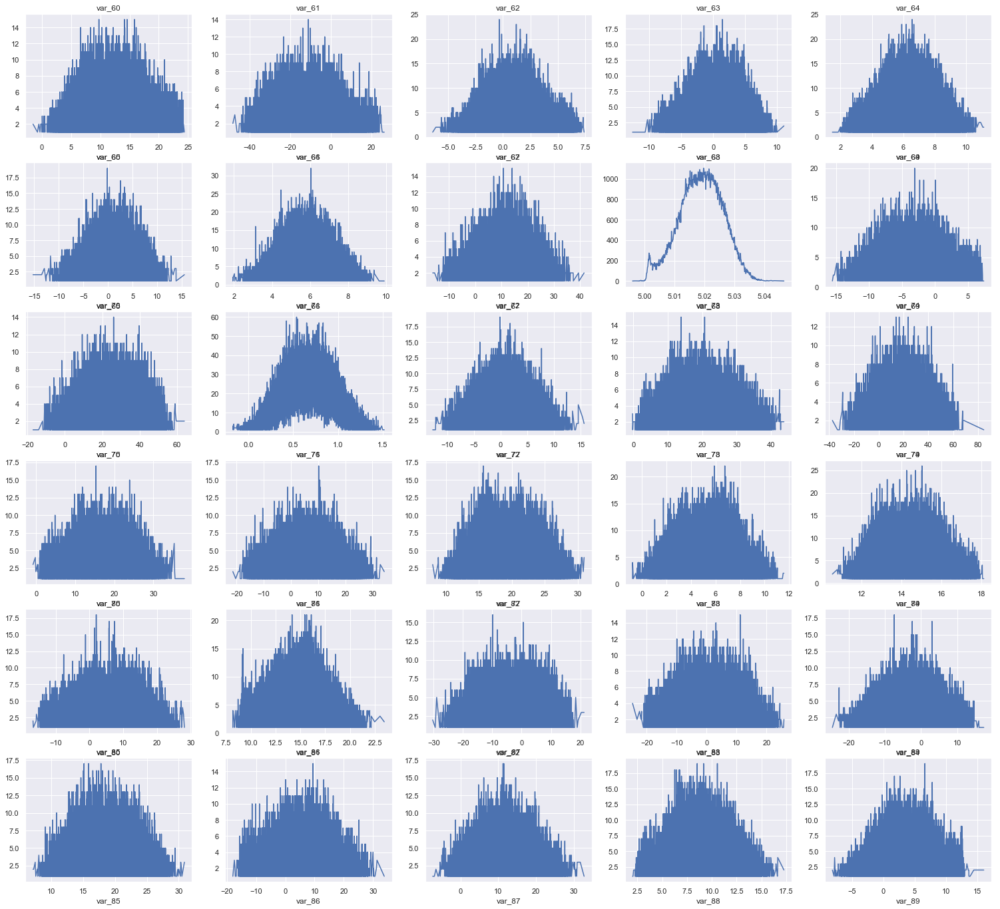

In [500]:
plt.figure(figsize=(26, 24))
for i, col in enumerate(list(train.columns)[30*idx+2:30*(idx+1)+2]):
    plt.subplot(6, 5, i + 1)
    test.groupby(col).size().plot()
    plt.title(col)

idx += 1

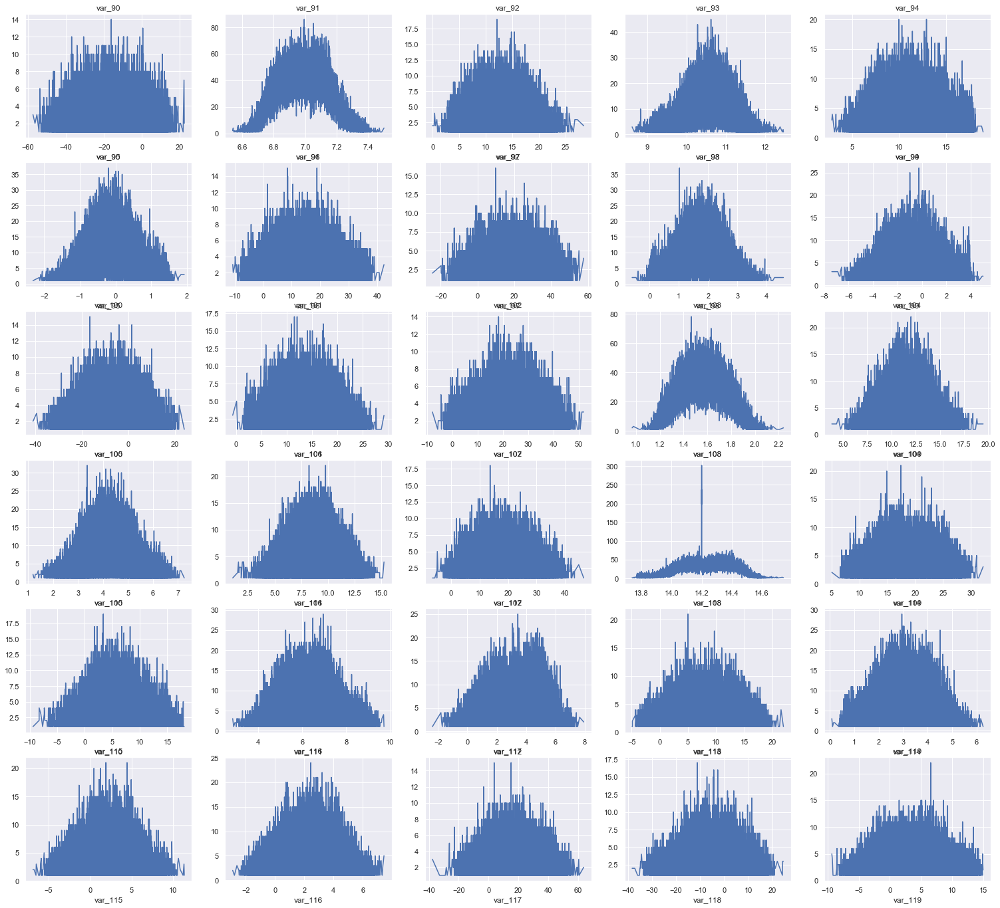

In [501]:
plt.figure(figsize=(26, 24))
for i, col in enumerate(list(train.columns)[30*idx+2:30*(idx+1)+2]):
    plt.subplot(6, 5, i + 1)
    test.groupby(col).size().plot()
    plt.title(col)

idx += 1

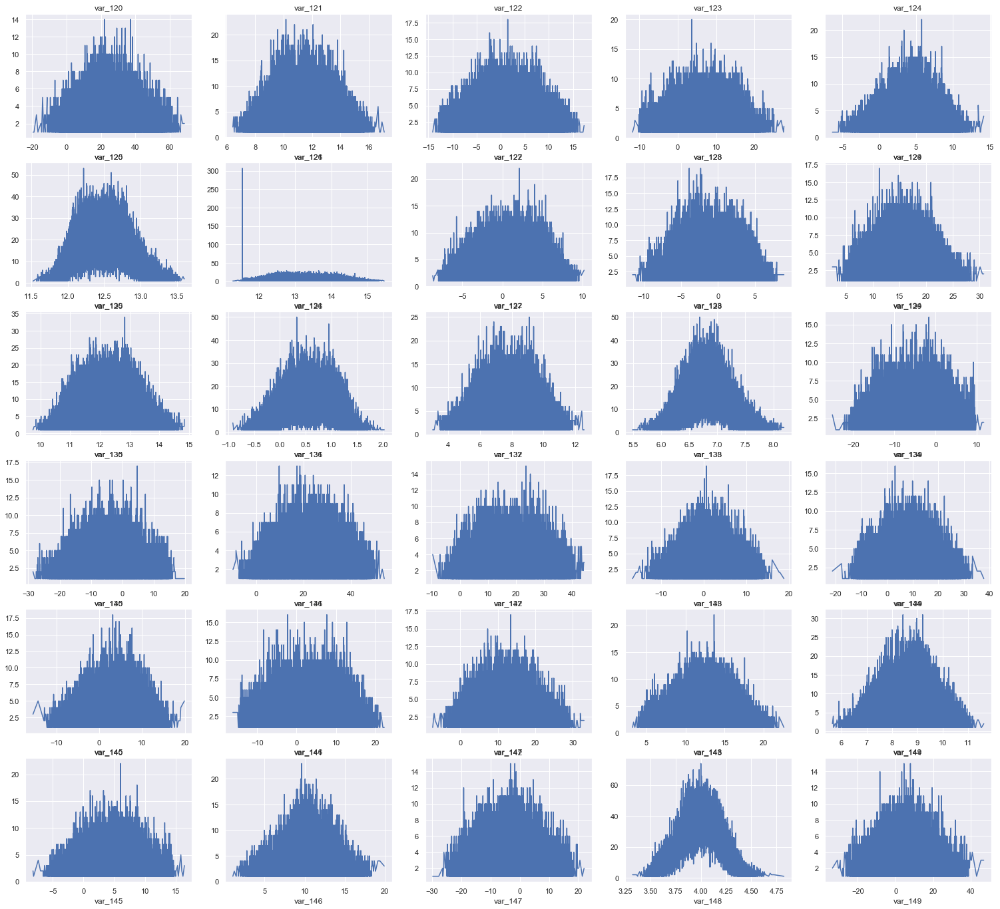

In [502]:
plt.figure(figsize=(26, 24))
for i, col in enumerate(list(train.columns)[30*idx+2:30*(idx+1)+2]):
    plt.subplot(6, 5, i + 1)
    test.groupby(col).size().plot()
    plt.title(col)

idx += 1

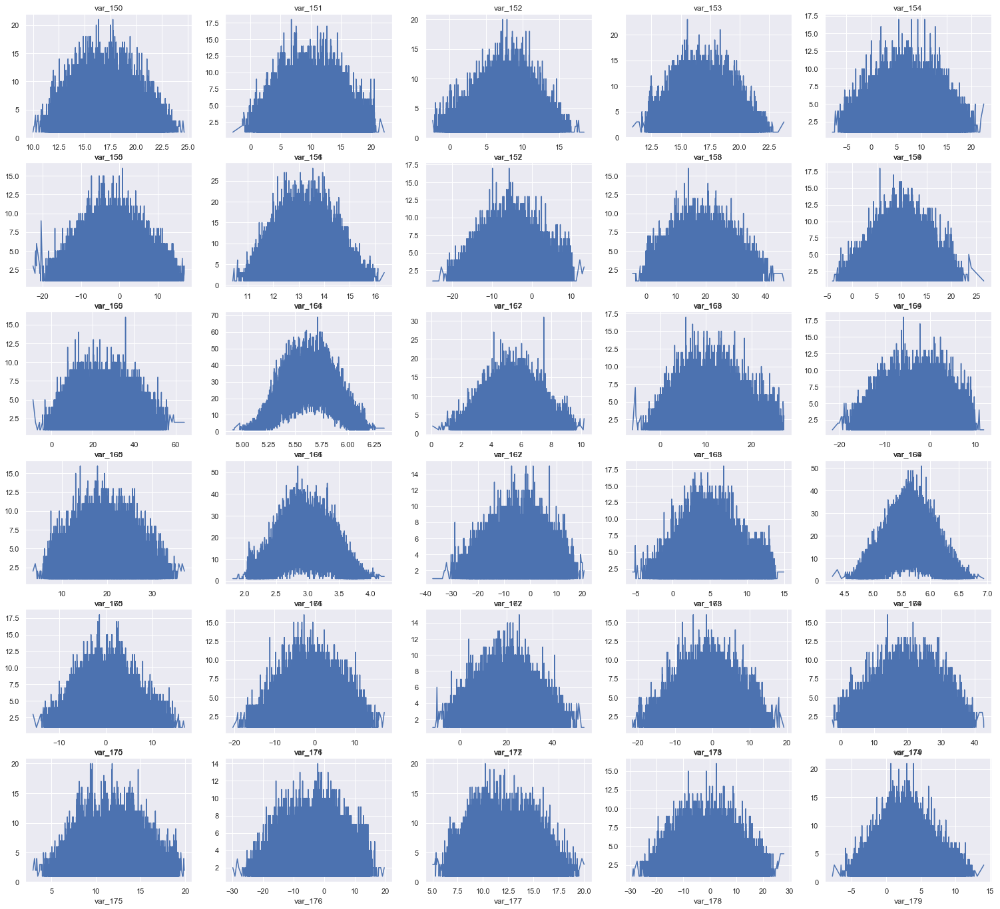

In [503]:
plt.figure(figsize=(26, 24))
for i, col in enumerate(list(train.columns)[30*idx+2:30*(idx+1)+2]):
    plt.subplot(6, 5, i + 1)
    test.groupby(col).size().plot()
    plt.title(col)

idx += 1

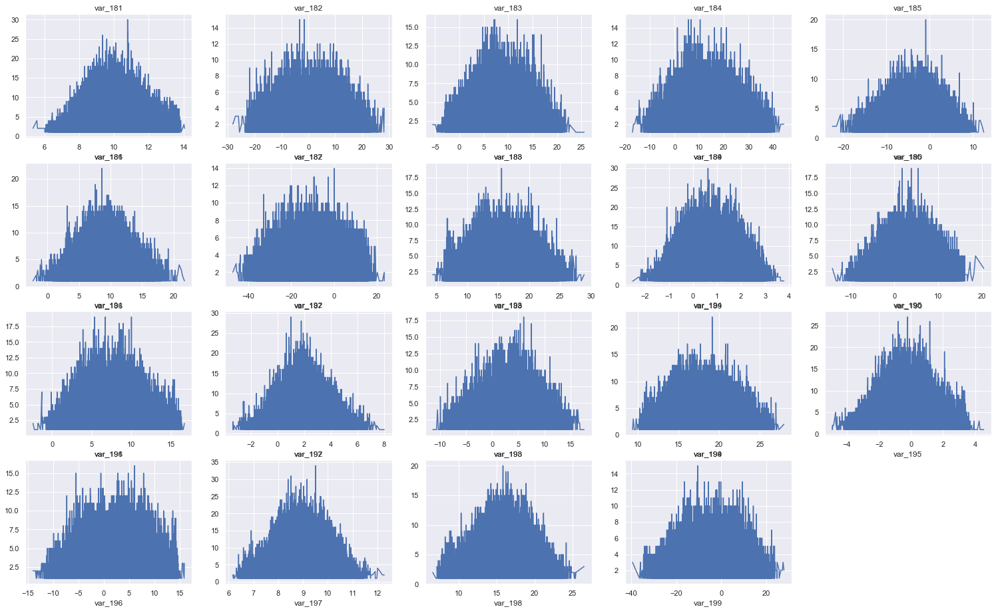

In [507]:
plt.figure(figsize=(26, 24))
for i, col in enumerate(list(test.columns)[30*idx+2:30*(idx+1)+2]):
    plt.subplot(6, 5, i + 1)
    test.groupby(col).size().plot()
    plt.title(col)

idx += 1

## var68

In [473]:
train

,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,var_11,var_12,var_13,var_14,var_15,var_16,var_17,var_18,var_19,var_20,var_21,var_22,var_23,var_24,var_25,var_26,var_27,var_28,var_29,var_30,var_31,var_32,var_33,var_34,var_35,var_36,var_37,var_38,var_39,var_40,var_41,var_42,var_43,var_44,var_45,var_46,var_47,var_48,var_49,var_50,var_51,var_52,var_53,var_54,var_55,var_56,var_57,var_58,var_59,var_60,var_61,var_62,var_63,var_64,var_65,var_66,var_67,var_68,var_69,var_70,var_71,var_72,var_73,var_74,var_75,var_76,var_77,var_78,var_79,var_80,var_81,var_82,var_83,var_84,var_85,var_86,var_87,var_88,var_89,var_90,var_91,var_92,var_93,var_94,var_95,var_96,var_97,var_98,var_99,var_100,var_101,var_102,var_103,var_104,var_105,var_106,var_107,var_108,var_109,var_110,var_111,var_112,var_113,var_114,var_115,var_116,var_117,var_118,var_119,var_120,var_121,var_122,var_123,var_124,var_125,var_126,var_127,var_128,var_129,var_130,var_131,var_132,var_133,var_134,var_135,var_136,var_137,var_138,var_139,var_140,var_141,var_142,var_143,var_144,var_145,var_146,var_147,var_148,var_149,var_150,var_151,var_152,var_153,var_154,var_155,var_156,var_157,var_158,var_159,var_160,var_161,var_162,var_163,var_164,var_165,var_166,var_167,var_168,var_169,var_170,var_171,var_172,var_173,var_174,var_175,var_176,var_177,var_178,var_179,var_180,var_181,var_182,var_183,var_184,var_185,var_186,var_187,var_188,var_189,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199,pred
0,train_0,0,8.9255,-6.7863,11.9081,5.0930,11.4607,-9.2834,5.1187,18.6266,-4.9200,5.7470,2.9252,3.1821,14.0137,0.5745,8.7989,14.5691,5.7487,-7.2393,4.2840,30.7133,10.5350,16.2191,2.5791,2.4716,14.3831,13.4325,-5.1488,-0.4073,4.9306,5.9965,-0.3085,12.9041,-3.8766,16.8911,11.1920,10.5785,0.6764,7.8871,4.6667,3.8743,-5.2387,7.3746,11.5767,12.0446,11.6418,-7.0170,5.9226,-14.2136,16.0283,5.3253,12.9194,29.0460,-0.6940,5.1736,-0.7474,14.8322,11.2668,5.3822,2.0183,10.1166,16.1828,4.9590,2.0771,-0.2154,8.6748,9.5319,5.8056,22.4321,5.0109,-4.7010,21.6374,0.5663,5.1999,8.8600,43.1127,18.3816,-2.3440,23.4104,6.5199,12.1983,13.6468,13.8372,1.3675,2.9423,-4.5213,21.4669,9.3225,16.4597,7.9984,-1.7069,-21.4494,6.7806,11.0924,9.9913,14.8421,0.1812,8.9642,16.2572,2.1743,-3.4132,9.4763,13.3102,26.5376,1.4403,14.7100,6.0454,9.5426,17.1554,14.1104,24.3627,2.0323,6.7602,3.9141,-0.4851,2.5240,1.5093,2.5516,15.5752,-13.4221,7.2739,16.0094,9.7268,0.8897,0.7754,4.2218,12.0039,13.8571,-0.7338,-1.9245,15.4462,12.8287,0.3587,9.6508,6.5674,5.1726,3.1345,29.4547,31.4045,2.8279,15.6599,8.3307,-5.6011,19.0614,11.2663,8.6989,8.3694,11.5659,-16.4727,4.0288,17.9244,18.5177,10.7800,9.0056,16.6964,10.4838,1.6573,12.1749,-13.1324,17.6054,11.5423,15.4576,5.3133,3.6159,5.0384,6.6760,12.6644,2.7004,-0.6975,9.5981,5.4879,-4.7645,-8.4254,20.8773,3.1531,18.5618,7.7423,-10.1245,13.7241,-3.5189,1.7202,-8.4051,9.0164,3.0657,14.3691,25.8398,5.8764,11.8411,-19.7159,17.5743,0.5857,4.4354,3.9642,3.1364,1.6910,18.5227,-2.3978,7.8784,8.5635,12.7803,-1.0914,0.014813
1,train_1,0,11.5006,-4.1473,13.8588,5.3890,12.3622,7.0433,5.6208,16.5338,3.1468,8.0851,-0.4032,8.0585,14.0239,8.4135,5.4345,13.7003,13.8275,-15.5849,7.8000,28.5708,3.4287,2.7407,8.5524,3.3716,6.9779,13.8910,-11.7684,-2.5586,5.0464,0.5481,-9.2987,7.8755,1.2859,19.3710,11.3702,0.7399,2.7995,5.8434,10.8160,3.6783,-11.1147,1.8730,9.8775,11.7842,1.2444,-47.3797,7.3718,0.1948,34.4014,25.7037,11.8343,13.2256,-4.1083,6.6885,-8.0946,18.5995,19.3219,7.0118,1.9210,8.8682,8.0109,-7.2417,1.7944,-1.3147,8.1042,1.5365,5.4007,7.9344,5.0220,2.2302,40.5632,0.5134,3.1701,20.1068,7.7841,7.0529,3.2709,23.4822,5.5075,13.7814,2.5462,18.1782,0.3683,-4.8210,-5.4850,13.7867,-13.5901,11.0993,7.9022,12.2301,0.4768,6.8852,8.0905,10.9631,11.7569,-1.2722,24.7876,26.6881,1.8944,0.6939,-13.6950,8.4068,35.4734,1.7093,15.1866,2.6227,7.3412,32.0888,13.9550,13.0858,6.6203,7.1051,5.3523,8.5426,3.6159,4.1569,3.0454,7.8522,-11.5100,7.5109,31.5899,9.5018,8.2736,10.1633,0.1225,1

In [341]:
def var_68_month(x):
    if 2017 < x and x <= 2018:
        return x - 2017
    elif 2018 < x and x <= 2019:
        return x - 2018
    else:
        return x - 2019

In [346]:
(((train.var_68 * 10000 - 7000) / 365 + 1900).apply(var_68_month) * 12)

0          1.282192
1          4.931507
2          5.194521
3          4.931507
4          7.594521
5          1.315068
6          3.550685
7          1.906849
8          2.860274
9          6.147945
10         4.471233
11         6.016438
12         1.939726
13         6.410959
14         4.372603
15         0.493151
16         5.654795
17         5.621918
18         0.328767
19         6.739726
20         6.279452
21         6.904110
22         7.331507
23         9.567123
24         4.569863
25         6.739726
26         3.583562
27         8.547945
28         5.687671
29         4.339726
30         7.627397
31         0.263014
32         0.789041
33         6.082192
34         5.621918
35         2.301370
36         5.589041
37         4.536986
38         5.687671
39         4.504110
40         0.361644
41         3.254795
42         2.169863
43         4.898630
44         4.175342
45         6.706849
46         5.194521
47         6.246575
48         5.424658
49         2.465753


## var108

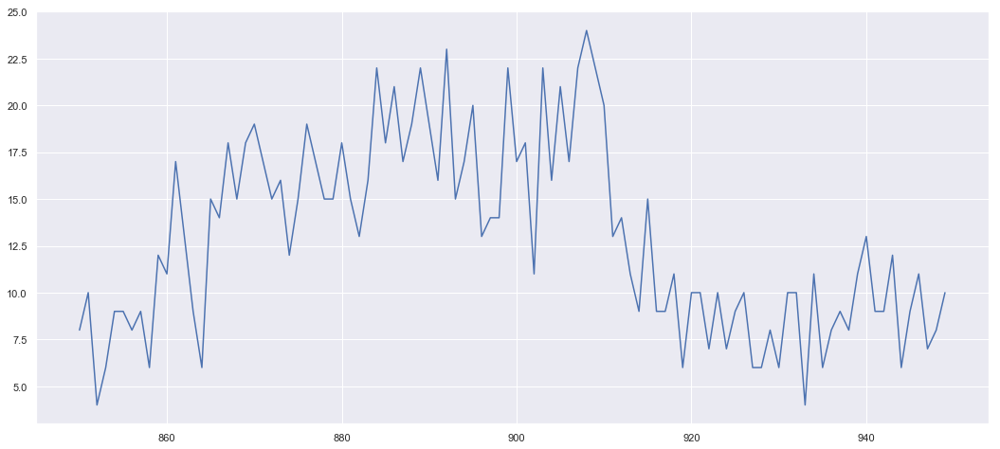

In [384]:
plt.figure(figsize=(18, 8))
plt.plot(time_series.loc['var_108'][850:950])

In [390]:
filter_id = train.sort_values('var_108').iloc[85000:92000].ID_code.values

In [391]:
train['new'] = 0

In [392]:
train.loc[train.ID_code.isin(filter_id), 'new'] = 1

## unique versus std

In [351]:
uniq_std = {"uniq":[], 'std': []}
for col in col_list:
    uniq_std['uniq'].append(train[col].unique().__len__())
    uniq_std['std'].append(train[col].std())

In [356]:
uniq_std = pd.DataFrame(uniq_std)

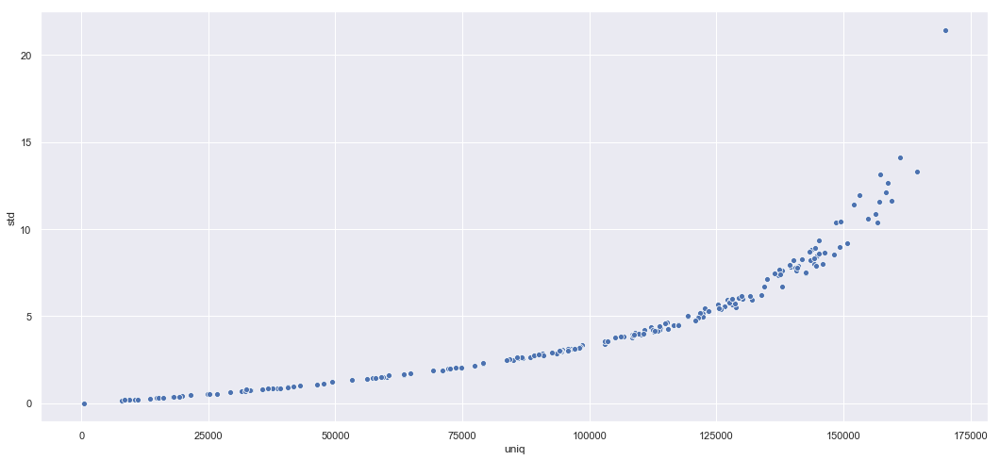

In [359]:
plt.figure(figsize=(18, 8))
sns.scatterplot(x='uniq', y='std', data=uniq_std)

## Shake Modeling

* Base: CV score: 0.89959 
* Shake : CV score: 0.89959 

In [208]:
train_0 = train[train.target == 0].copy()
train_1 = train[train.target == 1].copy()

In [210]:
np.random.seed(42)

In [211]:
for col in tqdm_notebook([col for col in train.columns if col not in ['ID_code', 'target']]):
    temp = train_0[col].values
    np.random.shuffle(temp)
    train_0[col] = temp

In [232]:
train = train_0.append(train_1).sort_index()

In [233]:
param = {
    'bagging_freq': 5,
    'bagging_fraction': 0.335,
    'boost_from_average': False,
    'boost': 'gbdt',
    'feature_fraction_seed': 47,
    'feature_fraction': 0.041,
    'learning_rate': 0.01,
    'max_depth': -1,
    'metric':'auc',
    'min_data_in_leaf': 80,
    'min_sum_hessian_in_leaf': 10.0,
    'num_leaves': 13,
    'num_threads': 8,
    'tree_learner': 'serial',
    'objective': 'binary', 
    'verbosity': -1
}

In [234]:
features = [c for c in train.columns if c not in ['ID_code', 'target']]
target = train['target']

In [235]:
folds = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

oof_lgb = np.zeros(len(train))
predictions_lgb = np.zeros(len(test))
feature_importance = pd.DataFrame()

train_columns = [c for c in train.columns if c not in ['ID_code', 'target']]

for fold_, (trn_idx, val_idx) in enumerate(folds.split(train, target.values)):    
    print("fold n°{}".format(fold_))
    trn_data = lgb.Dataset(train.iloc[trn_idx][train_columns], label=target.iloc[trn_idx])
    val_data = lgb.Dataset(train.iloc[val_idx][train_columns], label=target.iloc[val_idx])

    num_round = 60000
    clf = lgb.train(param, trn_data, num_round, valid_sets = [trn_data, val_data], verbose_eval=3000, early_stopping_rounds = 200)
    oof_lgb[val_idx] = clf.predict(train.iloc[val_idx][train_columns], num_iteration=clf.best_iteration)
    
    predictions_lgb += clf.predict(test[train_columns], num_iteration=clf.best_iteration) / folds.n_splits
    
    fold_importance = pd.DataFrame()
    fold_importance["Feature"] = train_columns
    fold_importance["importance"] = clf.feature_importance()
    fold_importance["fold"] = fold_ + 1
    feature_importance = pd.concat([feature_importance, fold_importance], axis=0)
    
    print("CV score: {:<8.5f}".format(roc_auc_score(target.values[val_idx], oof_lgb[val_idx])))
    
print("CV score: {:<8.5f}".format(roc_auc_score(target.values, oof_lgb)))

fold n°0
Training until validation scores don't improve for 200 rounds.
[3000]	training's auc: 0.921283	valid_1's auc: 0.89619
[6000]	training's auc: 0.935776	valid_1's auc: 0.899982
Early stopping, best iteration is:
[6692]	training's auc: 0.938526	valid_1's auc: 0.900164
CV score: 0.90016 
fold n°1
Training until validation scores don't improve for 200 rounds.
[3000]	training's auc: 0.921568	valid_1's auc: 0.896994
Early stopping, best iteration is:
[5020]	training's auc: 0.931758	valid_1's auc: 0.899399
CV score: 0.89940 
fold n°2
Training until validation scores don't improve for 200 rounds.
[3000]	training's auc: 0.920053	valid_1's auc: 0.902223
[6000]	training's auc: 0.934612	valid_1's auc: 0.90526
Early stopping, best iteration is:
[7100]	training's auc: 0.938982	valid_1's auc: 0.905676
CV score: 0.90568 
fold n°3
Training until validation scores don't improve for 200 rounds.
[3000]	training's auc: 0.921853	valid_1's auc: 0.894443
[6000]	training's auc: 0.936069	valid_1's auc: 0

## Simple Modeling

In [403]:
param = {
    'bagging_freq': 5,
    'bagging_fraction': 0.335,
    'boost_from_average': False,
    'boost': 'gbdt',
    'feature_fraction_seed': 47,
    'feature_fraction': 0.041,
    'learning_rate': 0.01,
    'max_depth': -1,
    'metric':'auc',
    'min_data_in_leaf': 80,
    'min_sum_hessian_in_leaf': 10.0,
    'num_leaves': 13,
    'num_threads': 8,
    'tree_learner': 'serial',
    'objective': 'binary', 
    'verbosity': -1,
    'num_threads': 16
}

In [404]:
features = [c for c in train.columns if c not in ['ID_code', 'target']]
target = train['target']

In [405]:
folds = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

oof_lgb = np.zeros(len(train))
predictions_lgb = np.zeros(len(test))
feature_importance = pd.DataFrame()

train_columns = [c for c in train.columns if c not in ['ID_code', 'target']]

for fold_, (trn_idx, val_idx) in enumerate(folds.split(train, target.values)):    
    print("fold n°{}".format(fold_))
    trn_data = lgb.Dataset(train.iloc[trn_idx][train_columns], label=target.iloc[trn_idx])
    val_data = lgb.Dataset(train.iloc[val_idx][train_columns], label=target.iloc[val_idx])

    num_round = 60000
    clf = lgb.train(param, trn_data, num_round, valid_sets = [trn_data, val_data], verbose_eval=3000, early_stopping_rounds = 200)
    oof_lgb[val_idx] = clf.predict(train.iloc[val_idx][train_columns], num_iteration=clf.best_iteration)
    
    predictions_lgb += clf.predict(test[train_columns], num_iteration=clf.best_iteration) / folds.n_splits
    
    fold_importance = pd.DataFrame()
    fold_importance["Feature"] = train_columns
    fold_importance["importance"] = clf.feature_importance()
    fold_importance["fold"] = fold_ + 1
    feature_importance = pd.concat([feature_importance, fold_importance], axis=0)
    
    print("CV score: {:<8.5f}".format(roc_auc_score(target.values[val_idx], oof_lgb[val_idx])))
    
print("CV score: {:<8.5f}".format(roc_auc_score(target.values, oof_lgb)))

fold n°0
Training until validation scores don't improve for 200 rounds.
[3000]	training's auc: 0.921561	valid_1's auc: 0.896028
[6000]	training's auc: 0.93604	valid_1's auc: 0.899441
Early stopping, best iteration is:
[6067]	training's auc: 0.936302	valid_1's auc: 0.899503
CV score: 0.89950 
fold n°1
Training until validation scores don't improve for 200 rounds.
[3000]	training's auc: 0.921516	valid_1's auc: 0.897313
[6000]	training's auc: 0.935852	valid_1's auc: 0.899958
Early stopping, best iteration is:
[6330]	training's auc: 0.937156	valid_1's auc: 0.900005
CV score: 0.90000 
fold n°2
Training until validation scores don't improve for 200 rounds.
[3000]	training's auc: 0.92043	valid_1's auc: 0.902095
[6000]	training's auc: 0.934863	valid_1's auc: 0.905863
Early stopping, best iteration is:
[6644]	training's auc: 0.937438	valid_1's auc: 0.906232
CV score: 0.90623 
fold n°3
Training until validation scores don't improve for 200 rounds.
[3000]	training's auc: 0.921865	valid_1's auc: 0

In [408]:
train['pred'] = oof_lgb

In [409]:
result = {}
for col in tqdm_notebook(col_list):
    windows = 1000
    iterations = 200000 / windows
    target = train.sort_values(col).pred.values
    result[col] = []
    for i in range(int(iterations)):
        result[col].append(target[i * windows: (i + 1) * windows].mean())

In [410]:
time_series = pd.DataFrame(result).T

In [467]:
idx=108

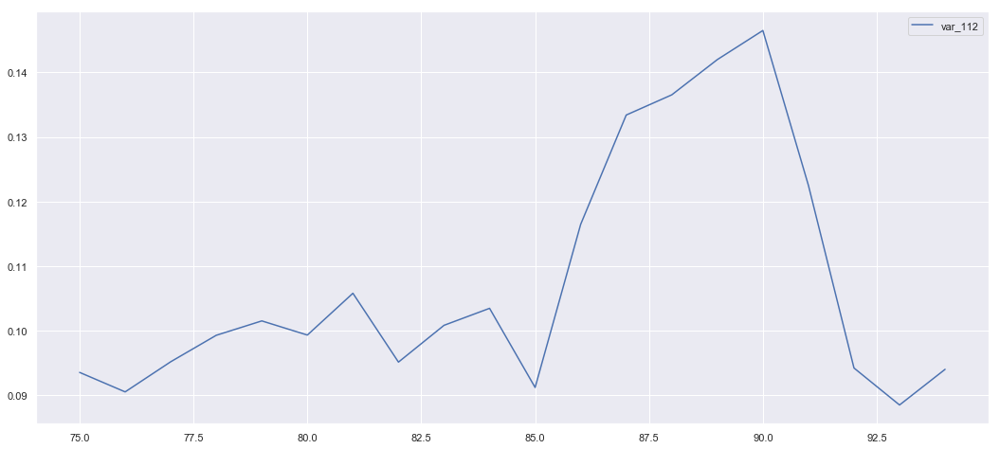

In [472]:
col = col_list[idx]
plt.figure(figsize=(18, 8))
plt.plot(time_series.loc['var_108'][75:95], label=col)
plt.legend()
idx += 1

## 삐꾸 인덱스

In [62]:
temp = train.target.to_frame()
temp['predict'] = oof_lgb
temp = temp.loc[(temp.predict <= 0.1)].reset_index()

In [63]:
temp['new_target']  = 0

In [64]:
temp.loc[temp.target == 1, 'new_target'] = 1

In [65]:
train = temp[['index', 'new_target']].merge(train.reset_index(), on='index', how='left').drop(['index', 'ID_code', 'target'], axis=1)

In [15]:
param = {
    'bagging_freq': 5,
    'bagging_fraction': 0.335,
    'boost_from_average': False,
    'boost': 'gbdt',
    'feature_fraction_seed': 47,
    'feature_fraction': 0.041,
    'learning_rate': 0.01,
    'max_depth': -1,
    'metric':'binary_logloss',
    'min_data_in_leaf': 80,
    'min_sum_hessian_in_leaf': 10.0,
    'num_leaves': 13,
    'num_threads': 8,
    'tree_learner': 'serial',
    'objective': 'binary', 
    'verbosity': -1,
    'num_threads': 16
}

In [16]:
features = [c for c in train.columns if c not in [""]]
target = train['new_target']

In [17]:
folds = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

oof_lgb = np.zeros(len(train))
# predictions_lgb = np.zeros(len(test))
feature_importance = pd.DataFrame()

train_columns = [c for c in train.columns if c not in ['ID_code', 'target']]

for fold_, (trn_idx, val_idx) in enumerate(folds.split(train, target.values)):    
    print("fold n°{}".format(fold_))
    trn_data = lgb.Dataset(train.iloc[trn_idx][train_columns], label=target.iloc[trn_idx])
    val_data = lgb.Dataset(train.iloc[val_idx][train_columns], label=target.iloc[val_idx])

    num_round = 60000
    clf = lgb.train(param, trn_data, num_round, valid_sets = [trn_data, val_data], verbose_eval=3000, early_stopping_rounds = 200)
    oof_lgb[val_idx] = clf.predict(train.iloc[val_idx][train_columns], num_iteration=clf.best_iteration)
    
#     predictions_lgb += clf.predict(test[train_columns], num_iteration=clf.best_iteration) / folds.n_splits
    
    fold_importance = pd.DataFrame()
    fold_importance["Feature"] = train_columns
    fold_importance["importance"] = clf.feature_importance()
    fold_importance["fold"] = fold_ + 1
    feature_importance = pd.concat([feature_importance, fold_importance], axis=0)
    
    print("CV score: {:<8.5f}".format(roc_auc_score(target.values[val_idx], oof_lgb[val_idx])))
    
print("CV score: {:<8.5f}".format(roc_auc_score(target.values, oof_lgb)))

fold n°0
Training until validation scores don't improve for 200 rounds.
[3000]	training's binary_logloss: 0.0125202	valid_1's binary_logloss: 0.0176091
[6000]	training's binary_logloss: 0.00281793	valid_1's binary_logloss: 0.0052946
[9000]	training's binary_logloss: 0.000996999	valid_1's binary_logloss: 0.00204075
Early stopping, best iteration is:
[10580]	training's binary_logloss: 0.000577614	valid_1's binary_logloss: 0.00119444
CV score: 1.00000 
fold n°1
Training until validation scores don't improve for 200 rounds.
[3000]	training's binary_logloss: 0.0125449	valid_1's binary_logloss: 0.0176089
[6000]	training's binary_logloss: 0.00282113	valid_1's binary_logloss: 0.00530612
[9000]	training's binary_logloss: 0.000998145	valid_1's binary_logloss: 0.00203906
Early stopping, best iteration is:
[10701]	training's binary_logloss: 0.000572436	valid_1's binary_logloss: 0.00118445
CV score: 1.00000 
fold n°2
Training until validation scores don't improve for 200 rounds.
[3000]	training's b

In [38]:
roc_auc_score(cv_test.target, clf.predict(cv_test[train_columns]))

0.9013276627284218

In [41]:
new = pd.DataFrame(clf.predict(cv_test[train_columns]))

In [45]:
te = cv_test.copy()

In [47]:
te['pred'] = clf.predict(cv_test[train_columns])

In [51]:
tt = clf_temp.predict(te[te.pred <= 0.1][train_columns])

In [43]:
new[new[0] <= 0.1]

,0
0,0.006938
2,0.002014
3,0.021930
5,0.055707
6,0.044543
9,0.050246
10,0.025858
11,0.019612
13,0.031741
14,0.025056


In [ ]:
clf_temp.predict()

In [ ]:
clf_temp

In [204]:
temp = target.to_frame()

In [205]:
temp['oof'] = oof_lgb

In [206]:
temp.sort_values('oof')

,new_target,oof
131526,0,0.000026
33874,0,0.000026
54983,0,0.000027
95004,0,0.000027
61147,0,0.000029
126196,0,0.000029
98953,0,0.000030
53676,0,0.000030
60050,0,0.000031
138262,0,0.000031
